# ImageFolder
1. the call to `make_dataset` method within the `__init__(...)` of parent ([`DatasetFolder`](https://pytorch.org/vision/main/_modules/torchvision/datasets/folder.html#DatasetFolder)) creates the iterative list of image-paths.
2. the `default_loader` passed to `super().__init__(...)` is a `pil_loader`, hence PIL images are returned.
3. on calling the object via index or when given into the model while training, the `__getitem__(...)` method of the parent class `DatasetFolder` gets called.
  1. apply loader on each item of paths in self.samples
  2. apply transform object on the loaded item
  3. return the transformed-loaded object with class-label(as integer).

In [ ]:
simple_train_dataset = torchvision.datasets.folder.ImageFolder(
    train_dir_path
)

simple_train_dataset.__class__

torchvision.datasets.folder.ImageFolder

In [ ]:
simple_train_dataset.__class__.__bases__

(torchvision.datasets.folder.DatasetFolder,)

In [ ]:
simple_train_dataset[0], simple_train_dataset[10]

((<PIL.Image.Image image mode=RGB size=768x512>, 0),
 (<PIL.Image.Image image mode=RGB size=500x375>, 0))

In [ ]:
print(f"#Images in simple_train_dataset = {len(simple_train_dataset)}, \
#images in the directory {train_dir_path} = \
{sum([len(os.listdir(os.path.join(train_dir_path, x))) for x in os.listdir(train_dir_path)])}")

#Images in simple_train_dataset = 244, #images in the directory ./drive/My Drive/learning pytorch/ants_vs_bees_classification/hymenoptera/train = 245


In [ ]:
print(simple_train_dataset.root)
print(simple_train_dataset.find_classes(simple_train_dataset.root))

./drive/My Drive/learning pytorch/ants_vs_bees_classification/hymenoptera/train
(['ants', 'bees'], {'ants': 0, 'bees': 1})


In [ ]:
print(len(simple_train_dataset.samples), "\n\n", type(simple_train_dataset.samples[0]))

244 

 <class 'tuple'>


In [ ]:
print(simple_train_dataset.samples[0], "\n\n", simple_train_dataset.samples[10])

('./drive/My Drive/learning pytorch/ants_vs_bees_classification/hymenoptera/train/ants/0013035.jpg', 0) 

 ('./drive/My Drive/learning pytorch/ants_vs_bees_classification/hymenoptera/train/ants/1360291657_dc248c5eea.jpg', 0)


In [ ]:
print(simple_train_dataset.imgs[0], "\n\n", simple_train_dataset.imgs[10])

('./drive/My Drive/learning pytorch/ants_vs_bees_classification/hymenoptera/train/ants/0013035.jpg', 0) 

 ('./drive/My Drive/learning pytorch/ants_vs_bees_classification/hymenoptera/train/ants/1360291657_dc248c5eea.jpg', 0)


# Transforms

In [ ]:
#         torchvision.transforms.RandomResizedCrop(size=224),
#         torchvision.transforms.RandomHorizontalFlip(p=0.5),
#         torchvision.transforms.RandomRotation(degrees=(0, 180)),
#         torchvision.transforms.ColorJitter(brightness=.5, hue=.3),
#         torchvision.transforms.ToTensor(),
#         torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),

## RandomHorizontalFlip

 <font color="pink">Disadvantages</font>
- Object tracking
  - rather than the football, the right-winger could become the left-winger and vice-versa, so any problem pertaining to positional-analysis will be affected
- Object detection
  - the bounding box needs to be re-measured(flipped) accordingly, it remains unchanged only when the object is centrally located.
- Recognise text in images
  - if a task is about/involves recognising text written in the image(OCR), the reversed text should be illegible and not be labelled as that of the original image.

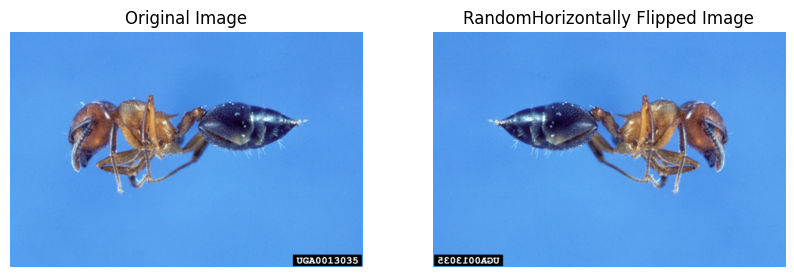

In [ ]:
sample_pil_img = simple_train_dataset[0][0]

hori_flip_tfm = torchvision.transforms.RandomHorizontalFlip(p=0.7)
hori_flp_img = hori_flip_tfm(sample_pil_img)

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(hori_flp_img)
ax[0].set_title("Original Image")
ax[1].set_title("RandomHorizontally Flipped Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

## Resize
1. while resizing from say a size of 768 x 512 to 224 x 224, the internal pixel values of the resized image would've to be decided, its resizing afterall and not cropping.
2. to decide these 224 x 224 pixels from the original 768 x 512, interpolation methods are used.
3. ultimately, the [resize method](https://github.com/pytorch/vision/blob/main/torchvision/transforms/_functional_pil.py#L239) of `PIL.Image` class is used when input is a PIL image.
  1. which ultimately uses `_imaging`'s resize method, written in [`_imaging.c`](https://github.com/python-pillow/Pillow/blob/main/src/_imaging.c#L1859)
3. in **BiLinear interpolation**, to estimate the intensity of a target pixel in the resized image, weighted average of intensities of 4 nearest pixels of the target pixel are used.
  1. For example, when resizing a `768 × 12` image to `336 × 224`, each pixel in the new `336 × 224` image corresponds to a `2.2857 × 2.2857` region in the original `768 × 512` image.
  2. This region spans multiple pixels in both the horizontal and vertical directions.
  3. The weights of the averaging process are determined based on the fractional distances between the target pixel coordinates and the coordinates of the neighboring pixels in the original image.

### Bilinear interpolation

Size of original image = (768, 512), of resized image = (336, 224)


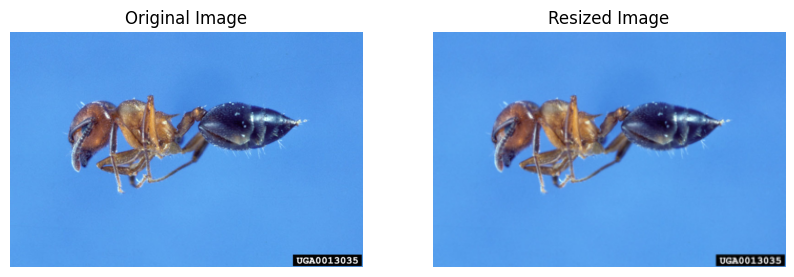

In [ ]:
# for original image: size=768x512

resize_tfm = torchvision.transforms.Resize(
    size=224
)

# If size is an int, smaller edge of the image will be matched to this number.
# i.e, if height > width, then image will be rescaled to
#  (size * height / width, size).

rsz_img = resize_tfm(sample_pil_img)

print(f"Size of original image = {sample_pil_img.size}, \
of resized image = {rsz_img.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_img)
ax[0].set_title("Original Image"); ax[1].set_title("Resized Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

In [ ]:
sample_img_tensor = torchvision.transforms.functional.pil_to_tensor(sample_pil_img)
rsz_img_tensor = torchvision.transforms.functional.pil_to_tensor(rsz_img)

In [ ]:
print(sample_img_tensor[0, :3, :3].numpy())
print(f"\nmean = {sample_img_tensor[0, :3, :3].numpy().mean()}\n")
print(rsz_img_tensor[0, 0, 0].item())

print("-"*60)

print(sample_img_tensor[0, :3, 1:4].numpy())
print(f"\nmean = {sample_img_tensor[0, :3, 1:4].numpy().mean()}\n")
print(rsz_img_tensor[0, 0, 1].item())

[[80 80 80]
 [81 81 81]
 [82 82 82]]

mean = 81.0

81
------------------------------------------------------------
[[80 80 81]
 [81 81 81]
 [82 82 81]]

mean = 81.0

81


### Nearest interpolation
in **nearest interpolation**, the nearest pixel is taken as an intensity-reference

1. to preserve aspect ratio, the resized image should be 336 x 224
2. scale-width = 768/336 = 2.286, scale-height = 512/224 = 2.286
3. so the (1,1) pixel in resized image will be nearest to the (1x2.286, 1x2.286) in the original image, i.e. (2,2) ((2,2) is nearer to (2.286,2.286) than (3,3)) in the original image. \
similarly (2, 1) $\rightarrow$ (2x2.286, 1x2.286) , i.e. (5, 2) in original image.

Size of original image = (768, 512), of resized image = (336, 224)


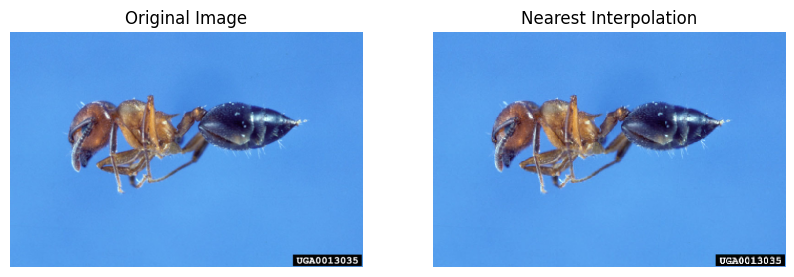

In [ ]:
from torchvision.transforms.functional import InterpolationMode

# for original image: size=768x512

resize_tfm_nearest_interpol = torchvision.transforms.Resize(
    size=224,
    interpolation=InterpolationMode.NEAREST
)

# If size is an int, smaller edge of the image will be matched to this number.
# i.e, if height > width, then image will be rescaled to
#  (size * height / width, size).

rsz_img_nearest_interpol = resize_tfm_nearest_interpol(sample_pil_img)

print(f"Size of original image = {sample_pil_img.size}, \
of resized image = {rsz_img_nearest_interpol.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_img_nearest_interpol)
ax[0].set_title("Original Image")
ax[1].set_title("Nearest Interpolation")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

In [ ]:
print(f"Pixel at (1,1) in resized image = {rsz_img_tensor[0, 0, 0].item()}\
, which should be (2,2) in original image = {sample_img_tensor[0, 1, 1].item()}")

print("-"*60)

print(f"Pixel at (2,2) in resized image = {rsz_img_tensor[0, 1, 1].item()}\
, which should be (5,5) in original image = {sample_img_tensor[0, 4, 4].item()}")

Pixel at (1,1) in resized image = 81, which should be (2,2) in original image = 81
------------------------------------------------------------
Pixel at (2,2) in resized image = 81, which should be (5,5) in original image = 81


In [ ]:
# check the R channel
print(rsz_img_tensor[0, -10:-2, -10:-2])

rsz_h, rsz_w = rsz_img_tensor[0].shape

print("\nSince this region has a variety of pixel intensities, lets check the \
interpolation here:\n")

print(f"Pixel at (-9, -9)[1-based index: {rsz_h-8, rsz_w-8}] in resized image = \
{rsz_img_tensor[0, -9, -9].item()}, which should be \
{(rsz_h-8)*2.286, (rsz_w-8)*2.286} ~ {round((rsz_h-8)*2.286, 0), round((rsz_w-8)*2.286, 0)} \
in original image = \
{sample_img_tensor[0, int(round((rsz_h-8)*2.286, 0))-1, int(round((rsz_w-8)*2.286, 0)) - 1].item()}")

print("-"*90)

print(f"490:500, 745:755 = \n{sample_img_tensor[0, 490:500, 745:755]}")

tensor([[ 16,  81,  89,  90,  50,   3,   1,   1],
        [ 42, 215, 184, 170, 100,   4,   1,   1],
        [ 43, 215, 134,  97,  31,   2,   1,   1],
        [ 36, 195, 177, 197, 161,  14,   2,   1],
        [  9,  37,  17,  75, 209,  38,   1,   1],
        [ 82, 125,  73, 137, 200,  29,   1,   1],
        [ 65, 168, 181, 174,  86,   5,   2,   2],
        [  3,  14,  21,  16,   3,   1,   3,   5]], dtype=torch.uint8)

Since this region has a variety of pixel intensities, lets check the interpolation here:

Pixel at (-9, -9)[1-based index: (216, 328)] in resized image = 215, which should be (493.776, 749.808) ~ (494.0, 750.0) in original image = 232
------------------------------------------------------------------------------------------
490:500, 745:755 = 
tensor([[  0,   0,  63,  86,  91,  81,  79,  86,  92,  76],
        [  1,  10, 190, 250, 253, 255, 250, 250, 254, 255],
        [  0,   0, 185, 251, 255, 236, 250, 247, 240, 242],
        [  0,   8, 182, 255, 232,  52,  34,  33,  39,

In [ ]:
print(sample_pil_img.im.__class__)

<class 'ImagingCore'>


In [ ]:
import inspect
try:
  inspect.signature(sample_pil_img.im.resize)
except:
  print(sample_pil_img.im.resize.__doc__)

None


<font size=5 color="red">GIVEN UP HERE FOR NOW, WILL LATER ON RETURN TO READ THE CODE </font>

### Bicubic interpolation
1. Calculate the fractional coordinates of the corresponding position in the original image.
2. Determine the neighboring pixels in the original image required for interpolation (typically a `4 × 4` neighborhood).
3. Use cubic interpolation to estimate the intensity of the target pixel based on the intensities of the neighboring pixels.
  1. fitting a cubic polynomial to the intensities of the neighboring pixels and evaluating the polynomial at the fractional coordinates to obtain the interpolated intensity value.
  2. This process is performed separately for each color channel (e.g., red, green, blue) in the image.
  3. could use padding so that fractional coordinates fall within original image boundary(prevent boundary effects)
    1. it could be that the 4 x 4 neighborhood for certain pixels falls outside of the original image, because the overlap of this *kernel* completely depends on the resolution of original and resized images.

Size of original image = (768, 512), of resized image = (336, 224)


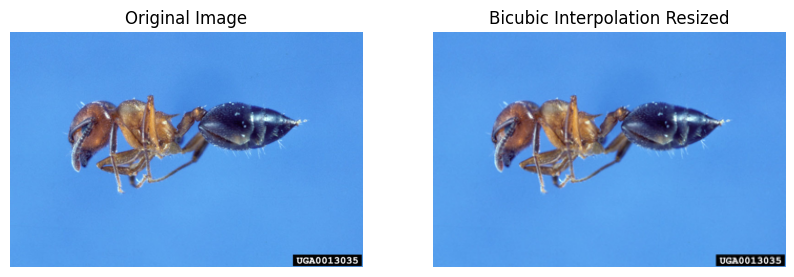

In [ ]:
from torchvision.transforms.functional import InterpolationMode

# for original image: size=768x512

resize_tfm_bicubic_interpol = torchvision.transforms.Resize(
    size=224,
    interpolation=InterpolationMode.BICUBIC
)

# If size is an int, smaller edge of the image will be matched to this number.
# i.e, if height > width, then image will be rescaled to
#  (size * height / width, size).

rsz_img_bicubic_interpol = resize_tfm_bicubic_interpol(sample_pil_img)

print(f"Size of original image = {sample_pil_img.size}, \
of resized image = {rsz_img_bicubic_interpol.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_img_bicubic_interpol)
ax[0].set_title("Original Image")
ax[1].set_title("Bicubic Interpolation Resized")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

### Box interpolation

Size of original image = (768, 512), of resized image = (336, 224)


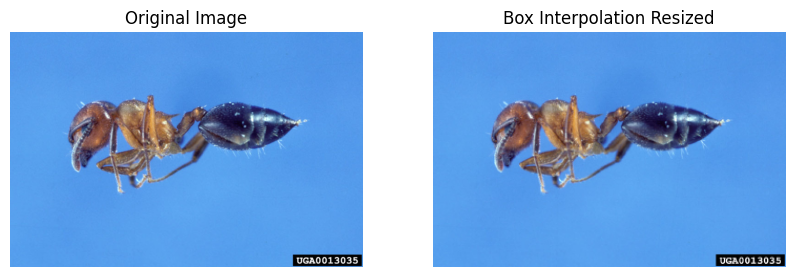

In [ ]:
from torchvision.transforms.functional import InterpolationMode

# for original image: size=768x512

resize_tfm_box_interpol = torchvision.transforms.Resize(
    size=224,
    interpolation=InterpolationMode.BOX
)

# If size is an int, smaller edge of the image will be matched to this number.
# i.e, if height > width, then image will be rescaled to
#  (size * height / width, size).

rsz_img_box_interpol = resize_tfm_box_interpol(sample_pil_img)

print(f"Size of original image = {sample_pil_img.size}, \
of resized image = {rsz_img_box_interpol.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_img_box_interpol)
ax[0].set_title("Original Image")
ax[1].set_title("Box Interpolation Resized")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

### Hamming interpolation

Size of original image = (768, 512), of resized image = (336, 224)


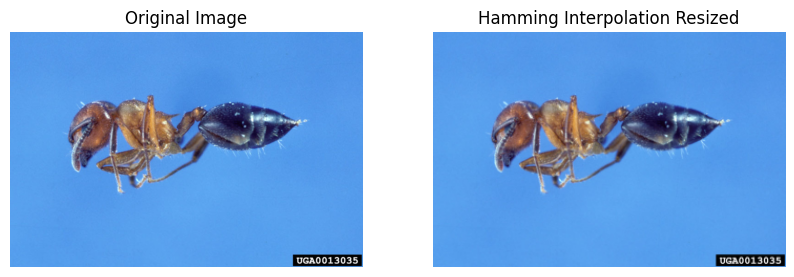

In [ ]:
from torchvision.transforms.functional import InterpolationMode

# for original image: size=768x512

resize_tfm_hamming_interpol = torchvision.transforms.Resize(
    size=224,
    interpolation=InterpolationMode.HAMMING
)

# If size is an int, smaller edge of the image will be matched to this number.
# i.e, if height > width, then image will be rescaled to
#  (size * height / width, size).

rsz_img_hamming_interpol = resize_tfm_hamming_interpol(sample_pil_img)

print(f"Size of original image = {sample_pil_img.size}, \
of resized image = {rsz_img_hamming_interpol.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_img_hamming_interpol)
ax[0].set_title("Original Image")
ax[1].set_title("Hamming Interpolation Resized")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

### Lanczos interpolation

Size of original image = (768, 512), of resized image = (336, 224)


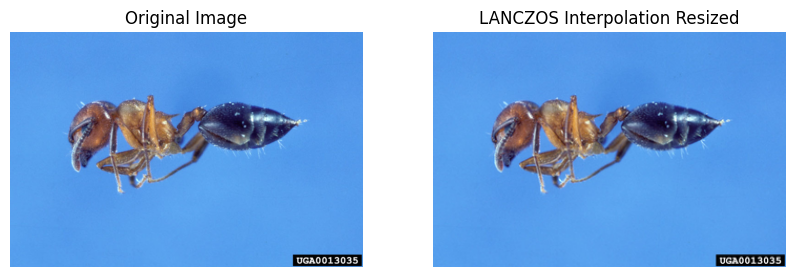

In [ ]:
from torchvision.transforms.functional import InterpolationMode

# for original image: size=768x512

resize_tfm_lanczos_interpol = torchvision.transforms.Resize(
    size=224,
    interpolation=InterpolationMode.LANCZOS
)

# If size is an int, smaller edge of the image will be matched to this number.
# i.e, if height > width, then image will be rescaled to
#  (size * height / width, size).

rsz_img_lanczos_interpol = resize_tfm_lanczos_interpol(sample_pil_img)

print(f"Size of original image = {sample_pil_img.size}, \
of resized image = {rsz_img_lanczos_interpol.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_img_lanczos_interpol)
ax[0].set_title("Original Image")
ax[1].set_title("LANCZOS Interpolation Resized")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

## Examine difference between interpolations

In [ ]:
nearest_vs_bicubic = torchvision.transforms.functional.pil_to_tensor(rsz_img_nearest_interpol) - torchvision.transforms.functional.pil_to_tensor(rsz_img_bicubic_interpol)

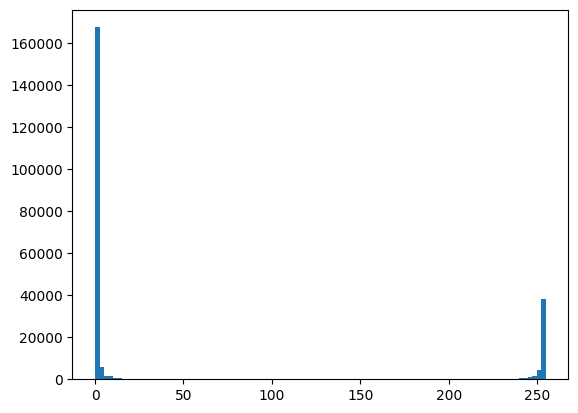

In [ ]:
import matplotlib.pyplot as plt

plt.hist(nearest_vs_bicubic.flatten(), bins=100)
plt.show()

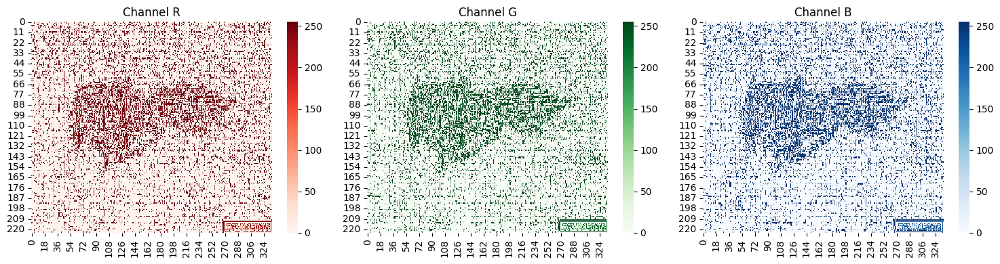

In [ ]:
import seaborn as sb

fig, ax = plt.subplots(1, 3, figsize=(15, 4))

sb.heatmap(nearest_vs_bicubic[0, :, :], cmap='Reds',  ax=ax[0]);ax[0].set_title('Channel R')
sb.heatmap(nearest_vs_bicubic[1, :, :], cmap='Greens', ax=ax[1]);ax[1].set_title('Channel G')
sb.heatmap(nearest_vs_bicubic[2, :, :], cmap='Blues', ax=ax[2]);ax[2].set_title('Channel B')

plt.tight_layout()
plt.show()

<font size=4>It seems as if the location where the bee is present is the one where the interpolation methods show the most difference, so lets examine that more closely.</font>

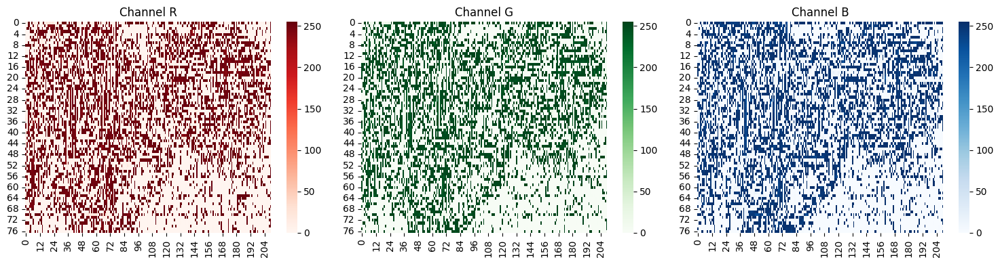

In [ ]:
import seaborn as sb

fig, ax = plt.subplots(1, 3, figsize=(15, 4))

sb.heatmap(nearest_vs_bicubic[0, 66:143, 60:270], cmap='Reds',  ax=ax[0]);ax[0].set_title('Channel R')
sb.heatmap(nearest_vs_bicubic[1, 66:143, 60:270], cmap='Greens', ax=ax[1]);ax[1].set_title('Channel G')
sb.heatmap(nearest_vs_bicubic[2, 66:143, 60:270], cmap='Blues', ax=ax[2]);ax[2].set_title('Channel B')

plt.tight_layout()
plt.show()

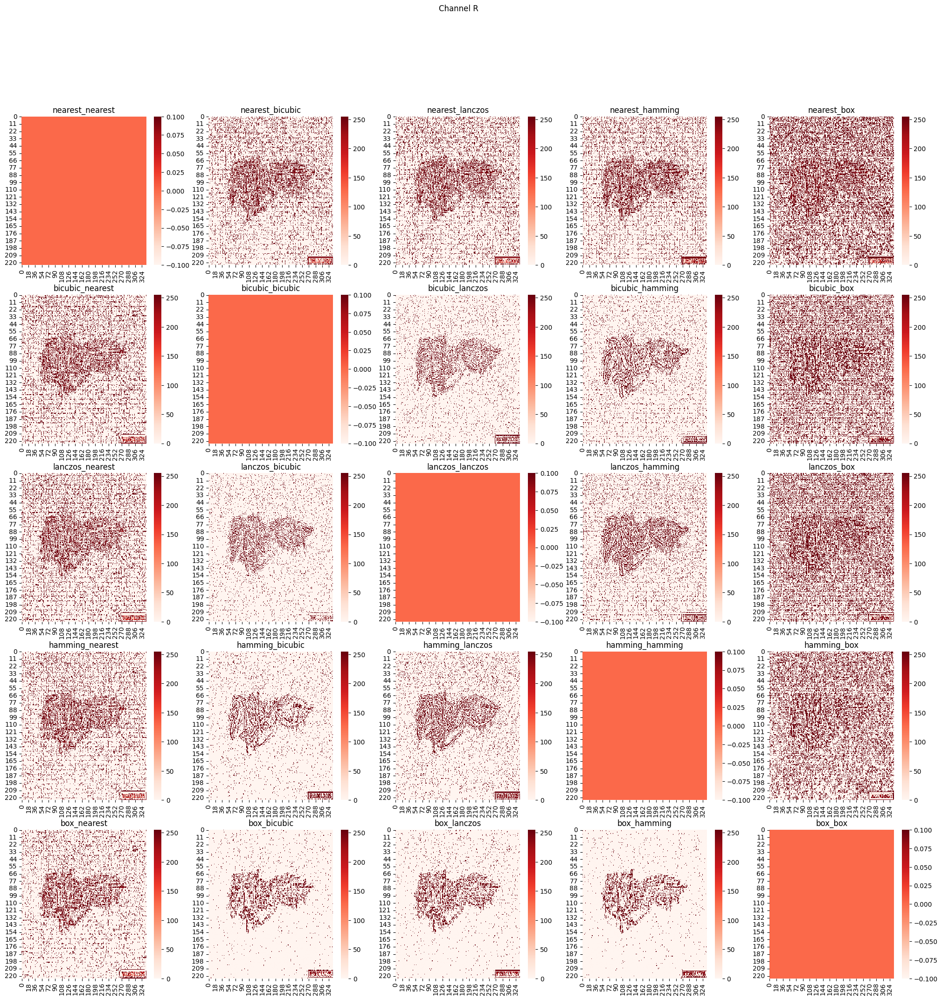

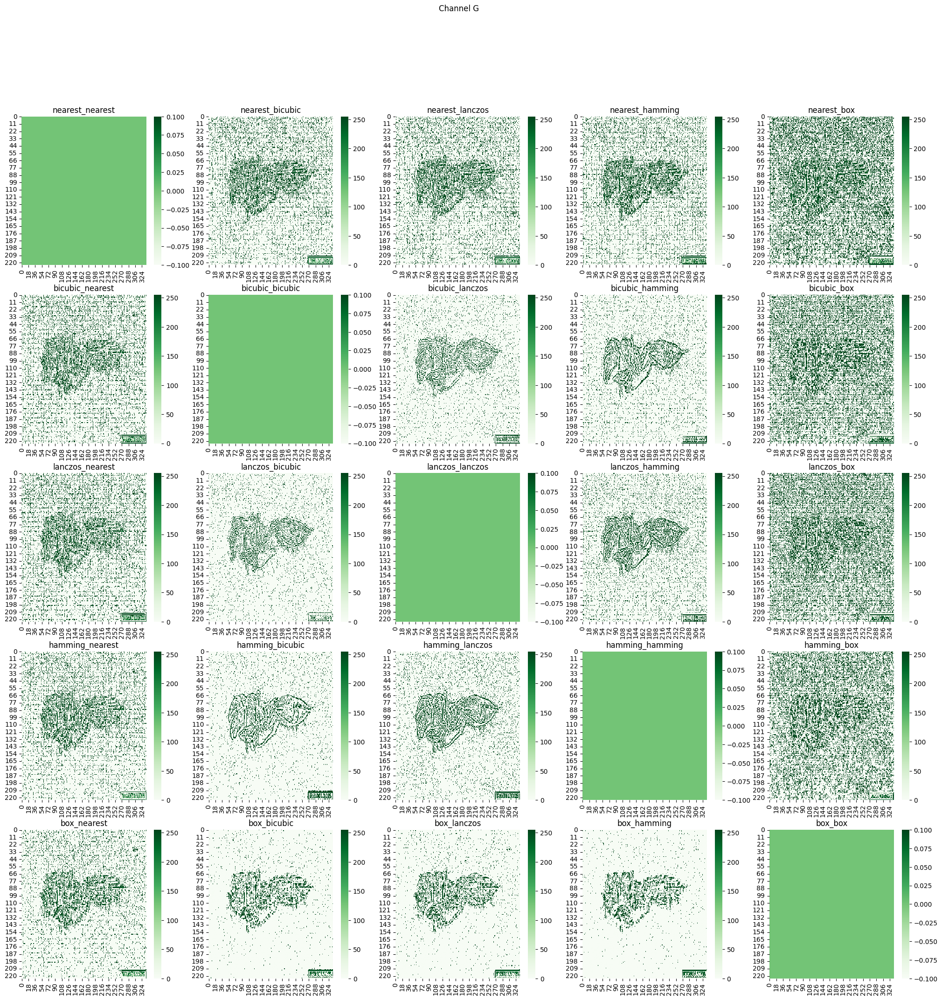

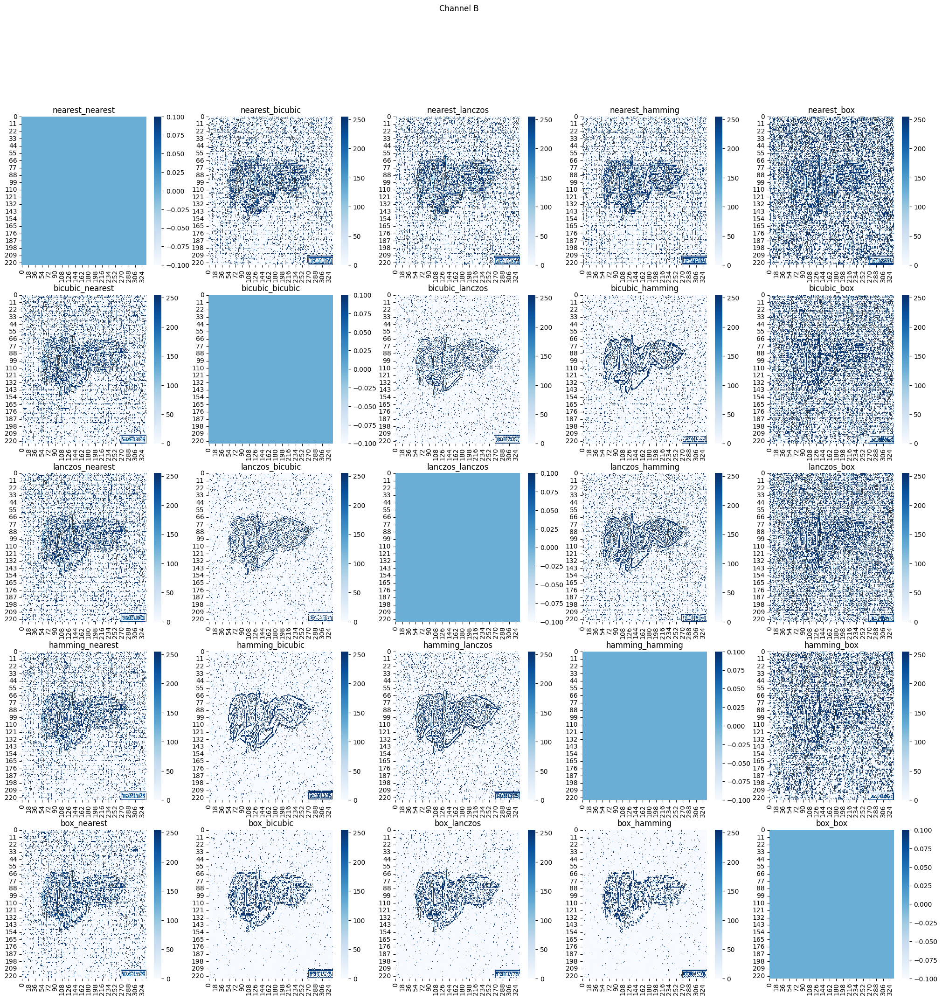

In [ ]:
tensor_dicts = {
    'nearest': torchvision.transforms.functional.pil_to_tensor(rsz_img_nearest_interpol),
    'bicubic': torchvision.transforms.functional.pil_to_tensor(rsz_img_bicubic_interpol),
    'lanczos': torchvision.transforms.functional.pil_to_tensor(rsz_img_lanczos_interpol),
    'hamming': torchvision.transforms.functional.pil_to_tensor(rsz_img_hamming_interpol),
    'box':     torchvision.transforms.functional.pil_to_tensor(rsz_img_box_interpol)
}

diff_dict = {}

from copy import deepcopy
interpolation_methods = deepcopy(list(tensor_dicts.keys()))

# create difference arrays of each pair
for m1 in interpolation_methods:
  for m2 in interpolation_methods:
    diff_dict[f"{m1}_{m2}"] = tensor_dicts[m1] - tensor_dicts[m2]


n_methods = len(interpolation_methods)

del tensor_dicts # memory issues

color_names, cmap_names = ['R', 'G', 'B'], ['Reds', 'Greens', 'Blues']
for color_channel in range(3):
  title =  f"Channel {color_names[color_channel]}"

  fig, ax = plt.subplots(n_methods, n_methods, figsize=(5*n_methods, 5*n_methods - 1))

  for i, m1 in enumerate(interpolation_methods):
    for j, m2 in enumerate(interpolation_methods):
      sb.heatmap(diff_dict[f"{m1}_{m2}"][color_channel, :, :], cmap=cmap_names[color_channel], ax=ax[i][j])
      ax[i][j].set_title(f"{m1}_{m2}")

  fig.suptitle(title)

plt.show()

## Random Cropping
1. [`torchvision.transforms.functional.crop(i, j, h, w)`](https://github.com/pytorch/vision/blob/main/torchvision/transforms/functional.py#L547) is called, after the `forward(...)` method in RandomCrop decides what these 4 arguments' values should be.
2. as observerd later on, cropping a size bigger than that of the padded image throws a ValueError saying crop-size is larger than image size.
3. <font color="lightgreen">Why use cropping for augmentation?</font>
  1. cropped images contain **finer details** of the image
    1. in this ants vs bees example, an ants ant-legs can be a cropped image, vs a bee's upper body containing its wings
    2. this can help the model in learning to detect for ant-legs in order to conclude if its an ant, or to detect for wings to conclude if its a bee.
    3. similar can be said about other features such as head/thorax/abdomen of ants vs bees.
    4. Hence, now relying on color, the model could rely on presence of physical features specific to ants/bees.
  2. Randomly cropped ant may be translated to a different part of the image, thus making the model robust to translational variance, i.e. **making it translational invariant**
    1. imagine an image with bee at the center
    2. now imagine a bottom-right crop window such that it covers most of the bee
    3. now the bee is at the top-left of the new image, but its still a bee, so the labelling is correct.
  3. **Scale-change invariance:** even if the image-scale is changed(elongated/shortened along any axis) the resultant ant/bee is still an ant/bee, which the model should be able to tell.
  4. **Robust to occlusions**
    1. occluded ant image: a test sample with an ant image with the tail covered by some white blemish(probably the camera didn't work at the time)
    2. in this case, the part of the ant seen is a cropped version, and if the model wasn't trained on cropped-ant-images, its less likely to identify this as an ant as it has gotten used to receiving full-body ant-images.
4. Cropping is <font color="pink">disadvantageous here</font>
  1. Object localisation tasks
    1. label = (object(class) , bounding box coordinates)
    2. random cropping renders the bb-coordinates useless, *unless* the *position* of the *cropping window is known* beforehand, which can be used to *modify* the *bb-coordinates* in the cropped image.
    3. <font color="yellow">This is discussed in the `ClampBoundingBoxes` section.</font>
  2. Object tracking
    1. assume football tracking on frames of a football match: whatif the football is cropped out, i.e. doesn't exist in the cropped image?
  3. Image Captioning
    1. Cropping parts of the image could remove important visual context that is necessary for generating accurate and coherent captions, leading to descriptions that are incomplete or irrelevant.
    2. a cropped image may contain only certain objects of the original image(probably mentioned in the caption), hence the caption should change accordingly, but that wouldn't be the case.
  4. Image Denoising
    1. remove noise from images while preserving important details and structures(input = noisy image, target = clean image, basically the TV-series trope of "make a clearer image of this zoomed-in CCTV footage".)
    2. Cropping regions of the image could remove informative regions that contain noise patterns, making it challenging for the denoising algorithm to learn effective noise removal strategies.
    3. However, if the same cropping window is used for the input and target images, then cropping could be used for this task.
    4. <u>The only problem that still remains:</u> Cropped regions may contain inconsistent noise patterns or image structures, making it challenging for the denoising model to learn effective denoising strategies across different regions of the image.

Size of original image = (768, 512), of cropped image = (224, 224)


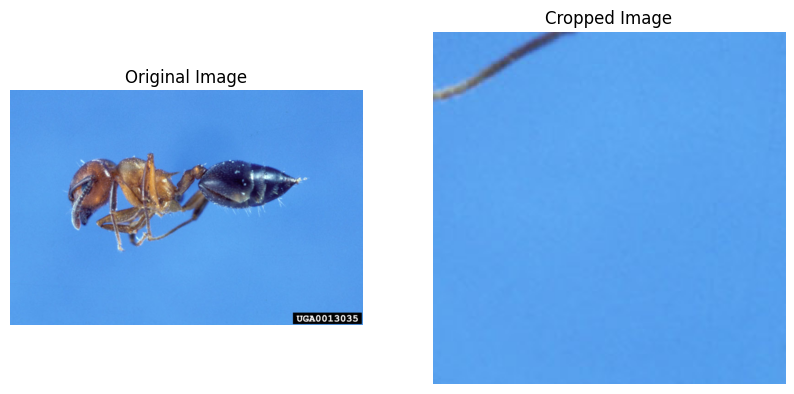

In [ ]:
# for original image: size=768x512

crop_tfm = torchvision.transforms.RandomCrop(
    size=224
)

# If provided a sequence of length 1, it will be interpreted as (size[0], size[0])

cropped_img = crop_tfm(sample_pil_img)

print(f"Size of original image = {sample_pil_img.size}, \
of cropped image = {cropped_img.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(cropped_img)
ax[0].set_title("Original Image"); ax[1].set_title("Cropped Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

### Constant padding

In [ ]:
print(torchvision.transforms.functional.pil_to_tensor(sample_pil_img))

tensor([[[ 80,  80,  80,  ...,  81,  79,  76],
         [ 81,  81,  81,  ...,  81,  79,  76],
         [ 82,  82,  82,  ...,  80,  79,  77],
         ...,
         [ 87,  87,  86,  ...,  44,  95,  90],
         [ 87,  87,  86,  ...,  84,  90,  84],
         [ 87,  87,  86,  ...,  79,  78,  84]],

        [[151, 151, 151,  ..., 152, 150, 147],
         [152, 152, 152,  ..., 152, 150, 147],
         [153, 153, 153,  ..., 151, 150, 148],
         ...,
         [160, 160, 159,  ...,  92, 158, 157],
         [160, 160, 159,  ..., 147, 160, 152],
         [160, 160, 159,  ..., 160, 159, 161]],

        [[233, 233, 233,  ..., 234, 232, 229],
         [234, 234, 234,  ..., 234, 232, 229],
         [235, 235, 235,  ..., 233, 232, 230],
         ...,
         [237, 237, 236,  ..., 141, 235, 228],
         [237, 237, 236,  ..., 226, 255, 233],
         [237, 237, 236,  ..., 242, 250, 233]]], dtype=torch.uint8)


(768, 512) (800, 544)


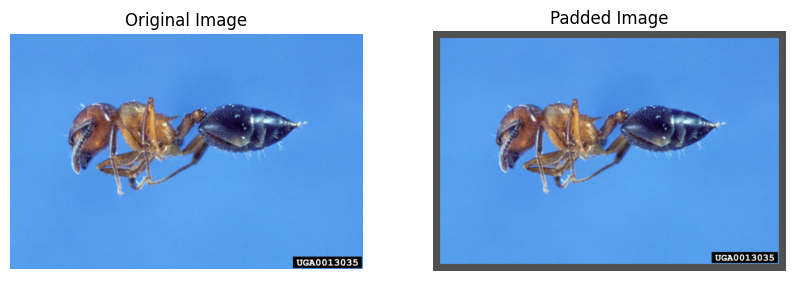

In [ ]:
padding = 16
fill = 80
padding_mode = 'constant'

padded_img = torchvision.transforms.functional.pad(
    sample_pil_img, padding, fill, padding_mode)

print(sample_pil_img.size, padded_img.size)

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(padded_img)
ax[0].set_title("Original Image"); ax[1].set_title("Padded Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

### Edge padding
Observe in the last code-cell of this section:

w.r.t. the top-edge, it is replicated upwards, and:
1. the top-left corner region is filled with the top-left pixel of the original image
2. the top-right corner region is filled with the top-right pixel of the original image

In [ ]:
sample_pil_img = simple_train_dataset[117][0]

padding = 1
padding_mode = 'edge'

padded_img = torchvision.transforms.functional.pad(
    sample_pil_img, padding, padding_mode=padding_mode)

print(sample_pil_img.size, padded_img.size)

(193, 130) (195, 132)


In [ ]:
sample_img_tensor = torchvision.transforms.functional.pil_to_tensor(sample_pil_img)
padded_img_tensor = torchvision.transforms.functional.pil_to_tensor(padded_img)

In [ ]:
print(sample_img_tensor.shape)

torch.Size([3, 130, 193])


image size is defined as (width, height), whereas width = number of columns, height = no. of rows, hence the order of shape is opposite to that of size.

In [ ]:
print(sample_img_tensor[0].shape)

torch.Size([130, 193])


In [ ]:
print("Top edge of original image:\n")
print(sample_img_tensor[0, 0, :].numpy().tolist())

Top edge of original image:

[255, 255, 252, 239, 240, 232, 234, 236, 243, 254, 6, 21, 14, 26, 5, 0, 11, 0, 0, 37, 148, 146, 118, 108, 106, 90, 85, 103, 103, 104, 71, 0, 0, 14, 25, 3, 14, 87, 138, 140, 124, 116, 101, 91, 99, 100, 74, 40, 0, 13, 17, 16, 23, 34, 33, 22, 32, 47, 21, 30, 34, 44, 17, 26, 30, 28, 29, 34, 40, 41, 46, 54, 43, 50, 51, 41, 34, 36, 36, 36, 40, 51, 34, 50, 49, 29, 49, 42, 31, 28, 28, 26, 24, 19, 15, 13, 18, 16, 14, 14, 14, 14, 12, 10, 16, 16, 16, 16, 14, 13, 11, 12, 16, 18, 18, 18, 19, 21, 23, 24, 18, 18, 18, 20, 22, 19, 15, 10, 14, 13, 13, 14, 14, 15, 15, 15, 15, 15, 15, 14, 14, 14, 13, 13, 12, 11, 11, 11, 11, 12, 13, 14, 11, 14, 19, 23, 24, 21, 17, 15, 25, 25, 8, 13, 23, 248, 229, 254, 249, 240, 254, 237, 245, 255, 239, 255, 250, 251, 253, 254, 255, 255, 255, 255, 255, 255, 255, 254, 254, 254, 254, 254, 255]


In [ ]:
print("Top and 2nd top edge of padded image:\n")
print(padded_img_tensor[0, 0, :].numpy().tolist())
print([-11] + padded_img_tensor[0, 1, 1:-1].numpy().tolist() + [-11])

Top and 2nd top edge of padded image:

[255, 255, 255, 252, 239, 240, 232, 234, 236, 243, 254, 6, 21, 14, 26, 5, 0, 11, 0, 0, 37, 148, 146, 118, 108, 106, 90, 85, 103, 103, 104, 71, 0, 0, 14, 25, 3, 14, 87, 138, 140, 124, 116, 101, 91, 99, 100, 74, 40, 0, 13, 17, 16, 23, 34, 33, 22, 32, 47, 21, 30, 34, 44, 17, 26, 30, 28, 29, 34, 40, 41, 46, 54, 43, 50, 51, 41, 34, 36, 36, 36, 40, 51, 34, 50, 49, 29, 49, 42, 31, 28, 28, 26, 24, 19, 15, 13, 18, 16, 14, 14, 14, 14, 12, 10, 16, 16, 16, 16, 14, 13, 11, 12, 16, 18, 18, 18, 19, 21, 23, 24, 18, 18, 18, 20, 22, 19, 15, 10, 14, 13, 13, 14, 14, 15, 15, 15, 15, 15, 15, 14, 14, 14, 13, 13, 12, 11, 11, 11, 11, 12, 13, 14, 11, 14, 19, 23, 24, 21, 17, 15, 25, 25, 8, 13, 23, 248, 229, 254, 249, 240, 254, 237, 245, 255, 239, 255, 250, 251, 253, 254, 255, 255, 255, 255, 255, 255, 255, 254, 254, 254, 254, 254, 255, 255]
[-11, 255, 255, 252, 239, 240, 232, 234, 236, 243, 254, 6, 21, 14, 26, 5, 0, 11, 0, 0, 37, 148, 146, 118, 108, 106, 90, 85, 103, 103, 10

In [ ]:
padding = 2
padding_mode = 'edge'

padded_img_2 = torchvision.transforms.functional.pad(
    sample_pil_img, padding, padding_mode=padding_mode)

print(sample_pil_img.size, padded_img.size)

padded_img_2_tensor = torchvision.transforms.functional.pil_to_tensor(padded_img_2)

print("1st,2nd,3rd edges from the top, of padded image:\n")
print(padded_img_2_tensor[0, 0, :].numpy().tolist())
print(padded_img_2_tensor[0, 1, :].numpy().tolist())
print([-11, -11] + padded_img_2_tensor[0, 2, 2:-2].numpy().tolist() + [-11, -11])

(193, 130) (195, 132)
1st,2nd,3rd edges from the top, of padded image:

[255, 255, 255, 255, 252, 239, 240, 232, 234, 236, 243, 254, 6, 21, 14, 26, 5, 0, 11, 0, 0, 37, 148, 146, 118, 108, 106, 90, 85, 103, 103, 104, 71, 0, 0, 14, 25, 3, 14, 87, 138, 140, 124, 116, 101, 91, 99, 100, 74, 40, 0, 13, 17, 16, 23, 34, 33, 22, 32, 47, 21, 30, 34, 44, 17, 26, 30, 28, 29, 34, 40, 41, 46, 54, 43, 50, 51, 41, 34, 36, 36, 36, 40, 51, 34, 50, 49, 29, 49, 42, 31, 28, 28, 26, 24, 19, 15, 13, 18, 16, 14, 14, 14, 14, 12, 10, 16, 16, 16, 16, 14, 13, 11, 12, 16, 18, 18, 18, 19, 21, 23, 24, 18, 18, 18, 20, 22, 19, 15, 10, 14, 13, 13, 14, 14, 15, 15, 15, 15, 15, 15, 14, 14, 14, 13, 13, 12, 11, 11, 11, 11, 12, 13, 14, 11, 14, 19, 23, 24, 21, 17, 15, 25, 25, 8, 13, 23, 248, 229, 254, 249, 240, 254, 237, 245, 255, 239, 255, 250, 251, 253, 254, 255, 255, 255, 255, 255, 255, 255, 254, 254, 254, 254, 254, 255, 255, 255]
[255, 255, 255, 255, 252, 239, 240, 232, 234, 236, 243, 254, 6, 21, 14, 26, 5, 0, 11, 0, 0, 3

### Reflect padding
From the documentation:

padding `[1, 2, 3, 4]` with 2 elements on both sides in reflect mode will result in `[3, 2, 1, 2, 3, 4, 3, 2]`.
- about 1, i.e. the top-left, reflect upto 2 positions on its left-side, you'll get `[3, 2]` (2 is closer to 1)
- about 4, i.e. the top-right, reflect upto 2 positions on its right-side, you'll get `[3, 2]` (3 is closer to 4)
- for non-constant mode of padding, ultimately [`numpy.pad`](https://github.com/pytorch/vision/blob/main/torchvision/transforms/_functional_pil.py#L215) is used.

--------------------------------------------------------------------------
- <font color="orange">What happens if padding is more than width of image?</font>
  - padding becomes recursive, i.e. till pad_width = a.size()-1 is covered, then this bigger array, 3*a.size()-2 sized, becomes the to-be reflected array, with the elements at the first and last positions of the bigger array becoming the mirror for the leftward and rightward expansion respectively.
- has the same benefits as that of symmetric padding:
  - mitigate boundary effects
  - feature extraction from different regions
- <font color="pink">Disadvantages/Shortcomings</font>(*shared with symmetric padding*)
  - object detection task: duplicate occurrence of same object + need to recompute bb-coordinates for these occurrences.
  - object tracking: whatif multiple footballs get introduced in a frame, *which one's the real?*

In [ ]:
a = [1, 2, 3, 4, 5]
np.pad(array = a, pad_width=5, mode='reflect')

array([4, 5, 4, 3, 2, 1, 2, 3, 4, 5, 4, 3, 2, 1, 2])

padding used for reflect = 193
original image size = (193, 130), padded image size = (579, 516)


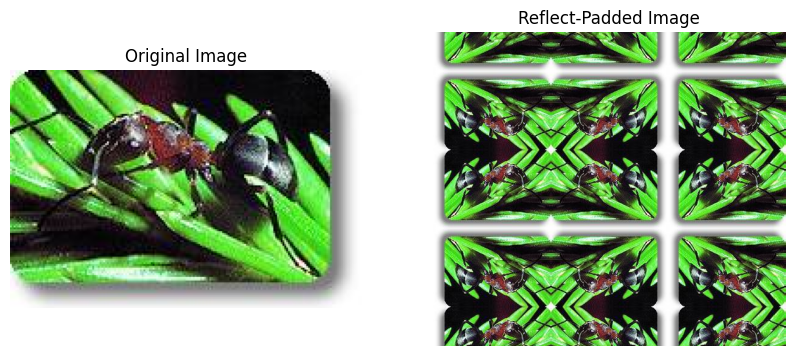

In [ ]:
sample_img_width = sample_pil_img.size[0]

padding = sample_img_width
padding_mode = 'reflect'

print(f"padding used for reflect = {padding}")

padded_img_reflected = torchvision.transforms.functional.pad(
    sample_pil_img, padding, padding_mode=padding_mode)

print(f"original image size = {sample_pil_img.size}, padded image size = \
{padded_img_reflected.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(padded_img_reflected)
ax[0].set_title("Original Image"); ax[1].set_title("Reflect-Padded Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

### Symmetric padding
- slightly different than reflect mode.
- relevant in order to maintain the continuity of edges and preserve spatial relationships in the image.
- features near the edges of the image are extracted accurately and without distortion.
  - Symmetric padding extends the edge pixels symmetrically, ensuring that the convolutional filters have access to the complete information near the edges.
  - reduces boundary effects(kernel, due to its size and sliding_window_jump parameter, may cross the image boundary, thus requiring padding) at edges by providing additional context for convolutional layers to operate at edges.
  - **enhancing translational invariance**:
    - Translation invariance means that the network should be able to recognize features regardless of their position within the image.
    - features can now be found at different regions of the padded image, rather than at the same location(w.r.t. original image), which makes the CNN learn to not be dependent on feature-searching at a certain region but rather to probe multiple regions.
- again, recursive symmetric padding occurs when `padding_length > len(arr)`

In [ ]:
a = [1, 2, 3, 4, 5]
print(f"with padding = 2, symmetric(a) = \
\n{np.pad(array = a, pad_width=2, mode='symmetric').tolist()}\
\n{[0, 0] + a + [0, 0]}\n")

print(f"with padding = 6, symmetric(a) = \
\n{np.pad(array = a, pad_width=6, mode='symmetric').tolist()}\n\
{[0]*6 + a + [0]*6}\n\
{[0] + np.pad(array = a, pad_width=5, mode='symmetric').tolist() + [0]}")

with padding = 2, symmetric(a) = 
[2, 1, 1, 2, 3, 4, 5, 5, 4]
[0, 0, 1, 2, 3, 4, 5, 0, 0]

with padding = 6, symmetric(a) = 
[5, 5, 4, 3, 2, 1, 1, 2, 3, 4, 5, 5, 4, 3, 2, 1, 1]
[0, 0, 0, 0, 0, 0, 1, 2, 3, 4, 5, 0, 0, 0, 0, 0, 0]
[0, 5, 4, 3, 2, 1, 1, 2, 3, 4, 5, 5, 4, 3, 2, 1, 0]


padding used for symmetric = 10
original image size = (193, 130), padded image size = (213, 150)


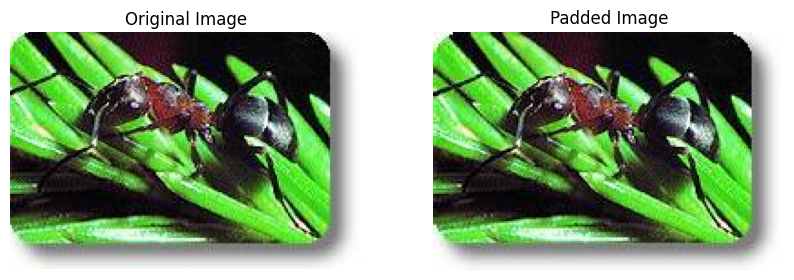

In [ ]:
padding = 10
padding_mode = 'symmetric'

print(f"padding used for symmetric = {padding}")

padded_img_symmetric = torchvision.transforms.functional.pad(
    sample_pil_img, padding, padding_mode=padding_mode)

print(f"original image size = {sample_pil_img.size}, padded image size = \
{padded_img_symmetric.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(padded_img)
ax[0].set_title("Original Image"); ax[1].set_title("Padded Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

padding used for symmetric = 193
original image size = (193, 130), padded image size = (579, 516)


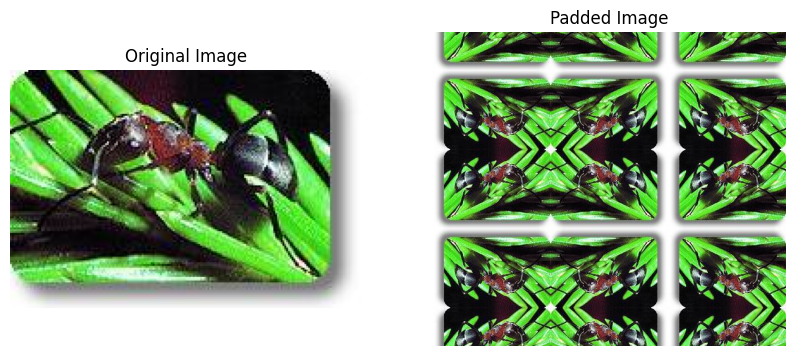

In [ ]:
sample_img_width = sample_pil_img.size[0]

padding = sample_img_width
padding_mode = 'symmetric'

print(f"padding used for symmetric = {padding}")

padded_img_symmetric = torchvision.transforms.functional.pad(
    sample_pil_img, padding, padding_mode=padding_mode)

print(f"original image size = {sample_pil_img.size}, padded image size = \
{padded_img_symmetric.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(padded_img_symmetric)
ax[0].set_title("Original Image"); ax[1].set_title("Padded Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

### Compare over-padded reflect with symmetric
- overextended reflect vs symmetric padding is the same.

padding used for symmetric = 193
original image size = (193, 130), symmetric-padded image size = (579, 516), reflect-padded image = (579, 516)


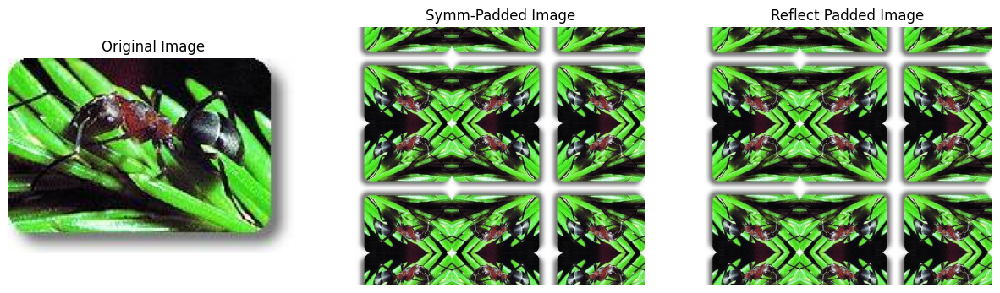

In [ ]:
sample_img_width = sample_pil_img.size[0]

padding = sample_img_width

print(f"padding used for symmetric = {padding}")

padded_img_reflected = torchvision.transforms.functional.pad(
    sample_pil_img, padding, padding_mode='reflect')

padded_img_symmetric = torchvision.transforms.functional.pad(
    sample_pil_img, padding, padding_mode='symmetric')

print(f"original image size = {sample_pil_img.size}, symmetric-padded image \
size = {padded_img_symmetric.size}, reflect-padded image = \
{padded_img_reflected.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(padded_img_symmetric)
ax[2].imshow(padded_img_reflected)

ax[0].set_title("Original Image"); ax[1].set_title("Symm-Padded Image")
ax[2].set_title("Reflect Padded Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off');ax[2].axis('off')

plt.show()

### Coming back to RandomCrop

Size of original image = (193, 130), of cropped image = (224, 224)


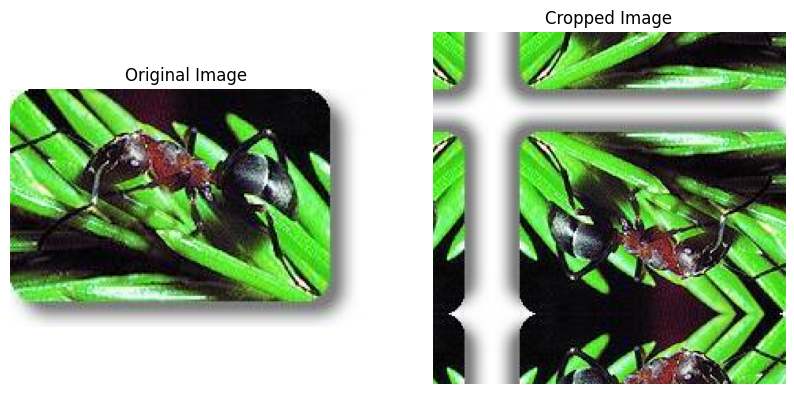

In [ ]:
sample_pil_img = simple_train_dataset[117][0]
padding_width = sample_pil_img.size[0] # width of original image

crop_tfm = torchvision.transforms.RandomCrop(
    size=224,
    padding=padding_width,
    padding_mode='reflect'
)

# If provided a sequence of length 1, it will be interpreted as (size[0], size[0])

cropped_img = crop_tfm(sample_pil_img) # this is basically calling the forward
                                      # method that applies the transform

print(f"Size of original image = {sample_pil_img.size}, \
of cropped image = {cropped_img.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(cropped_img)
ax[0].set_title("Original Image"); ax[1].set_title("Cropped Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

Random crop an image wherein padding is insufficient w.r.t. crop-size argument provided

In [ ]:
sample_pil_img = simple_train_dataset[117][0]
padding_width = 2

crop_tfm = torchvision.transforms.RandomCrop(
    size=224,
    padding=padding_width,
    padding_mode='reflect'
)

# If provided a sequence of length 1, it will be interpreted as (size[0], size[0])

cropped_img = crop_tfm(sample_pil_img) # this is basically calling the forward
                                      # method that applies the transform

print(f"Size of original image = {sample_pil_img.size}, \
of cropped image = {cropped_img.size}")

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(cropped_img)
ax[0].set_title("Original Image"); ax[1].set_title("Cropped Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

ValueError: Required crop size (224, 224) is larger than input image size (134, 197)

## Random Resize Cropping
- Crop the given image and resize it to desired size.
- some sort of re-sizing does occur before the actual resizing, in the form of scaling the original image while measuring what the crop-box should be
  - `target_area` is scaled using the minimum of the 2 elements provided in the `scale` argument.
- *`ratio = (r1, r2)`*: is just used to sample a random number in the uniform distirbution defined in the limits `log(r1), log(r2)` followed by $exp^{(RandomNumber)}$, which will be the aspect ratio(W/H) of the new image to be cropped out.
  - <font color="lightgreen">Random Cropping truly occurs</font> when `target_area < area` , i.e. the [image has been scaled down](https://github.com/pytorch/vision/blob/main/torchvision/transforms/transforms.py#L938), which will potentially help the new widths and heights be smaller than the original ones.
  - if a suitable random number for the new aspect ratio is drawn such that the [new widths and heights **are** smaller than the original ones](https://github.com/pytorch/vision/blob/main/torchvision/transforms/transforms.py#L944), <font color="lightgreen">Random Cropping has successfully occured</font>
- If either of the new width or new height is larger than its original value, [central cropping](https://github.com/pytorch/vision/blob/main/torchvision/transforms/transforms.py#L949) occurs.
- <font color="pink">Disadvantages of cropping + disadvantages of over-paddding with reflect/symmetric mode</font>

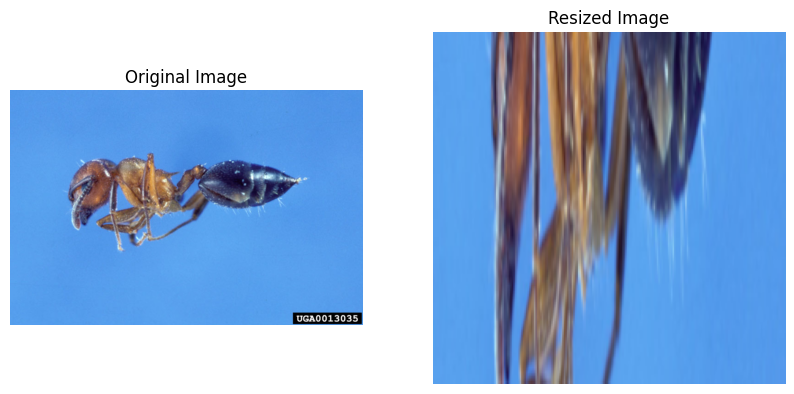

In [ ]:
default_scale_lb, default_scale_lb = 0.08, 0.9 # scales down the image
default_ratio_lb, default_ratio_lb = 1, 10 # so that uniform(0,1) is used for aspect ratio

resized_crop_tfm = torchvision.transforms.RandomResizedCrop(
    size=224,
    scale = (default_scale_lb, default_scale_lb),
    ratio = (default_ratio_lb, default_ratio_lb)
)

rsz_cropped_img = resized_crop_tfm(sample_pil_img)

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_cropped_img)
ax[0].set_title("Original Image"); ax[1].set_title("Resized Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

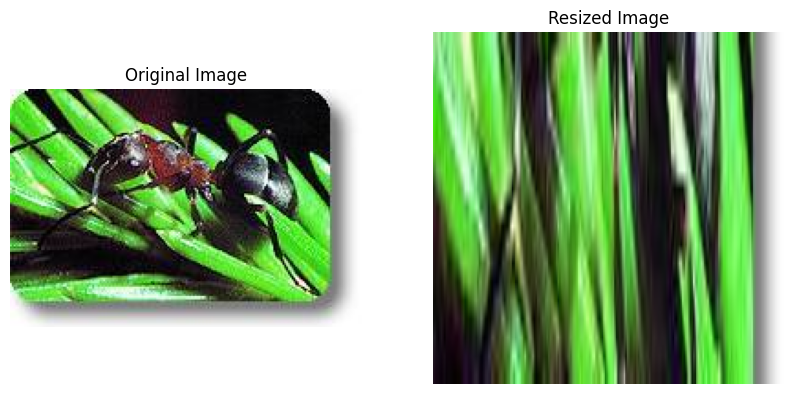

In [ ]:
sample_pil_img = simple_train_dataset[117][0]

resized_crop_tfm = torchvision.transforms.RandomResizedCrop(
    size=224,
    scale = (default_scale_lb, default_scale_lb),
    ratio = (default_ratio_lb, default_ratio_lb)
)

rsz_cropped_img = resized_crop_tfm(sample_pil_img)

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rsz_cropped_img)
ax[0].set_title("Original Image"); ax[1].set_title("Resized Image")

# Turn off axis
ax[0].axis('off');ax[1].axis('off')

plt.show()

## RandomRotation

- when `expand = False`, the image is simply rotated and then cropped to fit the original size
- when `expand = True`, the image is rotated and then an aspect-ratio preserving frame is established, and pixels that couldn't be filled in this frame by the rotated image are filled using the `fill` argument.

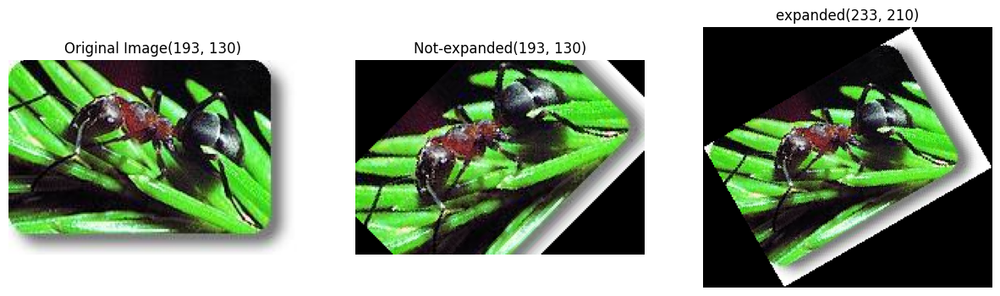

In [ ]:
sample_pil_img = simple_train_dataset[117][0]

# If degrees is a number instead of sequence like (min, max), the range of degrees
# will be (-degrees, +degrees).
# Hence provide min=max.
rot_tfm_1 = torchvision.transforms.RandomRotation(
    degrees=(45, 45),
    expand=False
)

rot_tfm_2 = torchvision.transforms.RandomRotation(
    degrees=(30, 30),
    expand=True
)

rot_img_1 = rot_tfm_1(sample_pil_img)
rot_img_2 = rot_tfm_2(sample_pil_img)

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(15, 4))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rot_img_1);ax[2].imshow(rot_img_2)

ax[0].set_title(f"Original Image{sample_pil_img.size}")
ax[1].set_title(f"Not-expanded{rot_img_1.size}")
ax[2].set_title(f"expanded{rot_img_2.size}")

# Turn off axis
ax[0].axis('off');ax[1].axis('off');ax[2].axis('off')

plt.show()

In [ ]:
# Center values should be in pixel coordinates but translated such that (0, 0)
# corresponds to image center.

width, height = sample_pil_img.size
print(f"width = {width}, height = {height}.")

center = [width/2, height/2]
center_f = [1.0 * (c - s * 0.5) for c, s in zip(center, [width, height])]
print(f"For center point as {center}, center_f = {center_f}\n")

center = [width*0.25, height*0.5]
center_f = [1.0 * (c - s * 0.5) for c, s in zip(center, [width, height])]
print(f"For center point as {center}, center_f = {center_f}\n")

width = 193, height = 130.
For center point as [96.5, 65.0], center_f = [0.0, 0.0]

For center point as [48.25, 65.0], center_f = [-48.25, 0.0]



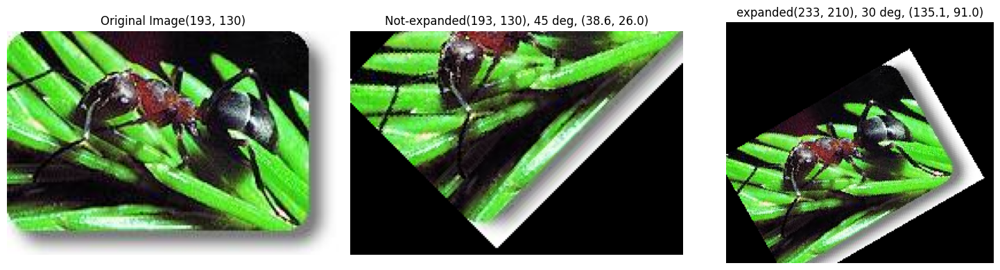

In [ ]:
sample_pil_img = simple_train_dataset[117][0]
width, height = sample_pil_img.size

# If degrees is a number instead of sequence like (min, max), the range of degrees
# will be (-degrees, +degrees).
# Hence provide min=max.
rot_tfm_1 = torchvision.transforms.RandomRotation(
    degrees=(45, 45),
    expand=False,
    center=(width*0.2, height*0.2)
)

rot_tfm_2 = torchvision.transforms.RandomRotation(
    degrees=(30, 30),
    expand=True,
    center=(width*0.7, height*0.7)
)

rot_img_1 = rot_tfm_1(sample_pil_img)
rot_img_2 = rot_tfm_2(sample_pil_img)

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(15, 4))

# Display the image using matplotlib
ax[0].imshow(sample_pil_img);ax[1].imshow(rot_img_1);ax[2].imshow(rot_img_2)

ax[0].set_title(f"Original Image{sample_pil_img.size}")
ax[1].set_title(f"Not-expanded{rot_img_1.size}, 45 deg, {width*0.2, height*0.2}")
ax[2].set_title(f"expanded{rot_img_2.size}, 30 deg, {width*0.7, height*0.7}")

# Turn off axis
ax[0].axis('off');ax[1].axis('off');ax[2].axis('off')

plt.tight_layout()
plt.show()

## ColorJitter
- change brightness, hue, contrast, saturation
- in this image-classification task, brightness wouldn't change the fact that the image is an ant.
- it could also be the case that a test sample can be dark/bright image, the model should still be able to tell, and that is more likely to happen if it already sees such images while training.
- <font color="orange">Note : </font>the hue transform is applied on the all channels at the same time.
- Other forms
  - [RandomPhotometricDistort](https://pytorch.org/vision/stable/generated/torchvision.transforms.v2.RandomPhotometricDistort.html#torchvision.transforms.v2.RandomPhotometricDistort): randomized ColorJitter.
  -
- <font color="pink">Drawbacks/Limitations</font>
  - Semantic inconsistency
    - each pixel labelled, on color jittering the intensity changes which may changes semantic meaning of that pixel and hence the label that it should belong
  - loss of contrast $\rightarrow$ Loss of details due to dark(Low contrast basically means a foggy/cloudy image)
  - medical image analysis/Satellite image interpretation
    - all color jitters unsuitable
- Practicality
  - sharpness/brightness/saturation jitter could still be seen in real-world examples due to environment-lighting and camera quality
  - but hue-jitter will rarely be seen, hence training the model on hue-jittered images will be impractical/unfruitful for real-world usage.
  - *Hue-jitter usage* may be invalid for many tasks where color is important to distinguish that object from others.
    - for instance, if *car* is a class, then the color of car won't matter.\
    hence hue jitter can be applied there.
    - but when a specific type of ant(army ant) is to be identified, then its color patterns are what will distinguish it.

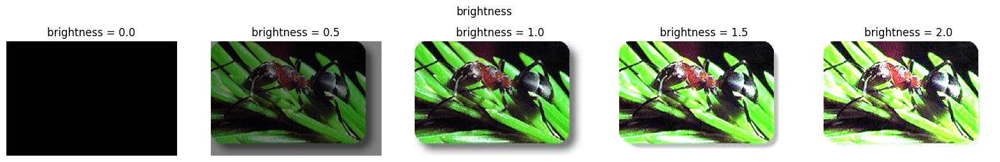

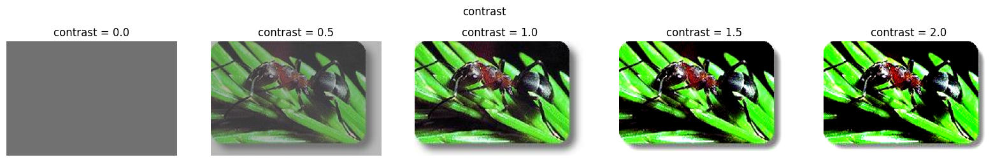

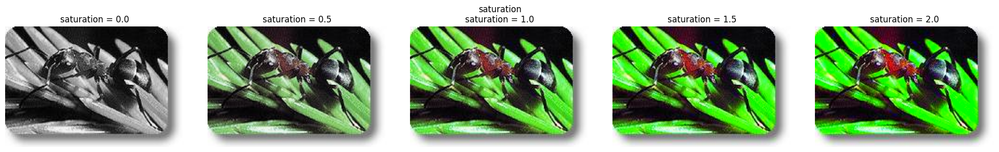

In [ ]:
sample_pil_img = simple_train_dataset[117][0]

bcs_allowed_values = np.linspace(0, 2, 5).tolist()

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

for j, jtr_dim in enumerate(['brightness', 'contrast', 'saturation']):

  fig, ax = plt.subplots(1, len(bcs_allowed_values), figsize=(4*len(bcs_allowed_values), 3))

  col_jtr_kwargs = {
      'brightness': 0,
      'contrast': 0,
      'saturation': 0
  }

  fig.suptitle(jtr_dim)

  for i, b in enumerate(bcs_allowed_values):

    col_jtr_kwargs[jtr_dim] = (b, b)

    col_jtr_tfm = torchvision.transforms.ColorJitter(**col_jtr_kwargs)

    jittered_img = col_jtr_tfm(sample_pil_img)

    ax[i].imshow(jittered_img)
    ax[i].set_title(f"{jtr_dim} = {b}")
    ax[i].axis('off')


plt.tight_layout()
plt.show()

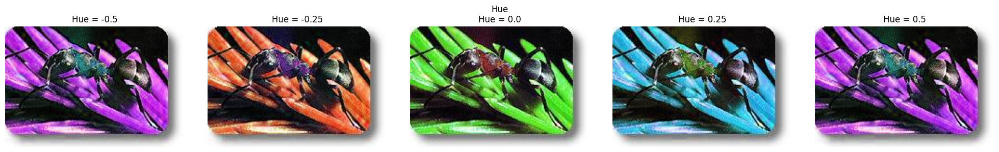

In [ ]:
sample_pil_img = simple_train_dataset[117][0]

hue_allowed_values = np.linspace(-0.5, 0.5, 5).tolist()

#######################. Visualize a PIL image #######################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, len(bcs_allowed_values), figsize=(4*len(bcs_allowed_values), 3))

fig.suptitle('Hue')

for i, hue in enumerate(hue_allowed_values):

  col_jtr_tfm = torchvision.transforms.ColorJitter(hue=(hue, hue))

  jittered_img = col_jtr_tfm(sample_pil_img)

  ax[i].imshow(jittered_img)
  ax[i].set_title(f"Hue = {hue}")
  ax[i].axis('off')


plt.tight_layout()
plt.show()

## RandomChannelPermutation
- benefits and limitations same as hue-jitter.

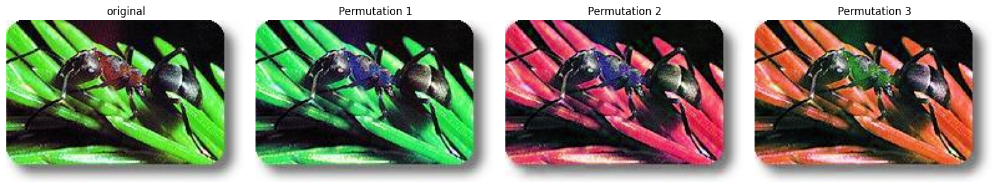

In [ ]:
import matplotlib.pyplot as plt

sample_pil_img = simple_train_dataset[117][0]
fig, ax = plt.subplots(1, 4, figsize=(16, 3))

for i in range(4):
  if i > 0:
    rcp_tfm = torchvision.transforms.v2.RandomChannelPermutation()
    chan_perm_img = rcp_tfm(sample_pil_img)
    ax[i].imshow(chan_perm_img)
    ax[i].axis('off')
    ax[i].set_title(f"Permutation {i}")
  else:
    ax[i].imshow(sample_pil_img)
    ax[i].axis('off')
    ax[i].set_title("original")

plt.tight_layout()
plt.show()

## Grayscale
1. <font color="lightgreen">Usage/Aptness</font>
  1. Texture Analysis(advanced edge detection)
    1. to detect a specific texture, color may not be important
    2. <img src="https://dfzljdn9uc3pi.cloudfront.net/2022/cs-869/1/fig-7-full.png" width="400"/>
  2. Shape Recognition
    1. Color may lead to unnecessary *noise* learning.
  3. OCR
    1. again, when text is to be read, tables extract, presence of color can serve as a distraction to the model
  4. Medical Imaging via X-Rays
  5. Gesture Recognition(advanced shape recognition)

In [ ]:
import matplotlib.pyplot as plt

sample_pil_img = simple_train_dataset[117][0]
fig, ax = plt.subplots(1, 2, figsize=(8, 3))

for i, val in enumerate([0,1,3]):
  if i > 0:
    gs_tfm = torchvision.transforms.v2.Grayscale(num_output_channels=val)
    grayscale_img = gs_tfm(sample_pil_img)
    ax[i].imshow(grayscale_img)
    ax[i].axis('off')
    ax[i].set_title(f"Grayscaled {val} channels")
  else:
    ax[i].imshow(sample_pil_img)
    ax[i].axis('off')
    ax[i].set_title("original")

plt.tight_layout()
plt.show()

## GaussianBlur
1. Gaussian Kernel used to blur the image
  1. an `odd x odd` kernel is [convoluted](https://github.com/pytorch/vision/blob/main/torchvision/transforms/v2/functional/_misc.py#L155) on image.
  2. kernel elements are gaussian-normal initialized(sigma is $\sigma$, $\mu$ = 0)
  3. `odd x odd` kernel has a center pixel which can be placed on a pixel in the image, making the sliding for convolution very easy to implement.
  4. the image is padded before convoluting with kernel to preserve size.
2. <font color="lightgreen">Aptness</font>
  1. Wherever robustness to noise is needed(*test image may be blurry*). \
  for instance: object detection and localisation, image segmentation(partition image into meaningful segments), image classification,
3. <font color="pink">Limitations</font>
  1. Wherever fine-details or texture or edge-presence is crucial to the task
  2. blur may spoil the texture(although you could argue that blur may make the model robust to the image-quality hence even in a *bad* image could recognise the texture)
  3. definitely screws up fine details, so *tasks* which *need* the *model to learn to spot fine details*.

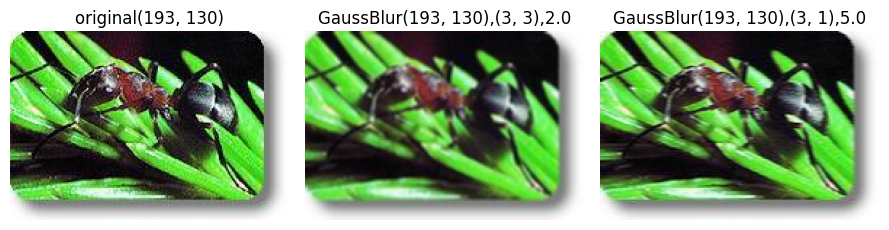

In [ ]:
import matplotlib.pyplot as plt

sample_pil_img = simple_train_dataset[117][0]

fig, ax = plt.subplots(1, 3, figsize=(9, 2.5))

ax[0].axis('off')
ax[0].set_title(f"original{sample_pil_img.size}")
ax[0].imshow(sample_pil_img)

########################## kernel-1  ##########################
kernel_size = (3, 3)
sigma = (2.0, 2.0) # harcodes uniform-random choosing of sigma

gblur_tfm = torchvision.transforms.v2.GaussianBlur(
    kernel_size=kernel_size, sigma=sigma)
gblur_img = gblur_tfm(sample_pil_img)

ax[1].imshow(gblur_img)
ax[1].axis('off')
ax[1].set_title(f"GaussBlur{gblur_img.size},{kernel_size},{sigma[0]}")

########################## kernel-2  ##########################
kernel_size = (3, 1)
sigma = (5.0, 5.0) # harcodes uniform-random choosing of sigma

gblur_tfm = torchvision.transforms.v2.GaussianBlur(
    kernel_size=kernel_size, sigma=sigma)
gblur_img = gblur_tfm(sample_pil_img)

ax[2].imshow(gblur_img)
ax[2].axis('off')
ax[2].set_title(f"GaussBlur{gblur_img.size},{kernel_size},{sigma[0]}")



plt.tight_layout()
plt.show()

## RandomInvert
- same disadvantages and benefits as *hue-jitter* or *random channel permutation*.
- [RandomSolarize](https://pytorch.org/vision/stable/generated/torchvision.transforms.v2.RandomSolarize.html#torchvision.transforms.v2.RandomSolarize) is also a randomized invert based on pixel intensity.

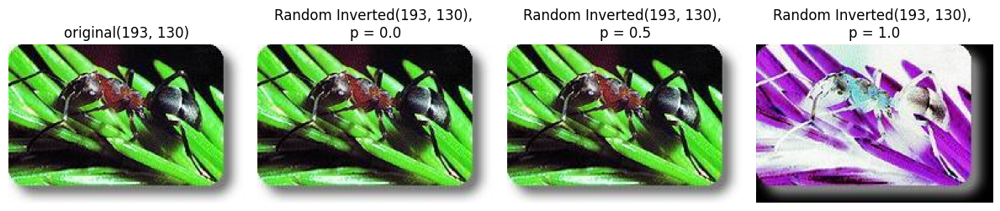

In [ ]:
import matplotlib.pyplot as plt

sample_pil_img = simple_train_dataset[117][0]

fig, ax = plt.subplots(1, 4, figsize=(12, 2.5))

ax[0].axis('off')
ax[0].set_title(f"original{sample_pil_img.size}")
ax[0].imshow(sample_pil_img)

########################## apply transform  ##########################

for idx, i in enumerate(np.linspace(0, 1, 3).tolist()):
  rand_invrt_tfm = torchvision.transforms.v2.RandomInvert(p=i)
  inverted_img = rand_invrt_tfm(sample_pil_img)

  ax[idx+1].imshow(inverted_img)
  ax[idx+1].axis('off')
  ax[idx+1].set_title(f"Random Inverted{inverted_img.size}, \np = {i}")


plt.tight_layout()
plt.show()

## RandomPosterize
1. [`code here`](https://github.com/pytorch/vision/blob/main/torchvision/transforms/transforms.py#L1882)
2. Each color channel has 8 bits
3. posterize means to reduce the no. of bits used to represent each channel
4. its a right-shift operation on the intensity value per pixel by `8-b` bits, if b is the no. of bits used to represent each channel.
5. regularization technique(noise introduction) to make the model more robust to dull images.
6. <font color="lightgreen">Aptness</font>
  1. Style transfer of image1 onto image2
  2. Texture classification

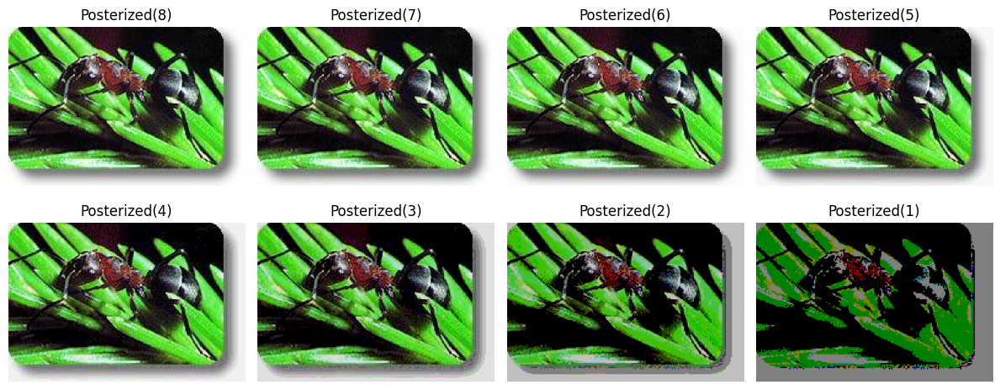

In [ ]:
import matplotlib.pyplot as plt

sample_pil_img = simple_train_dataset[117][0]

fig, ax = plt.subplots(2, 4, figsize=(12, 5))


########################## apply transform  ##########################

for i in range(8, 0, -1):
  pstrz_tfm = torchvision.transforms.v2.RandomPosterize(bits=i, p=1)
  posterized_img = pstrz_tfm(sample_pil_img)

  actual_idx = 8-i
  r, c = actual_idx// 4, actual_idx % 4

  ax[r][c].imshow(posterized_img)
  ax[r][c].axis('off')
  ax[r][c].set_title(f"Posterized({i})")


plt.tight_layout()
plt.show()

## RandomEqualize
1. [For PIL Images](https://pillow.readthedocs.io/en/stable/reference/ImageOps.html#PIL.ImageOps.equalize)
2. as the word suggests, tries to equalize the intensities as much as possible(hence a uniform distribution will be used)
3. `len(sample_pil_img.histogram(None)) == 768 == (256/3)` since 256 is the total no. of possible pixel intensities(0 - 255)
4. Steps
  1. construct histogram of pixel intensities to know how many pixels are how much intense
  2. [Histogram Equalization Medium Article](https://towardsdatascience.com/histogram-equalization-5d1013626e64)
5. effectively spreading out the most frequent intensity values, i.e. stretching out the intensity range of the image.
  1. This method **usually increases the global contrast of images** when its usable data is represented by close contrast values.
  2. This allows for **areas of lower local contrast to gain a higher contrast**.


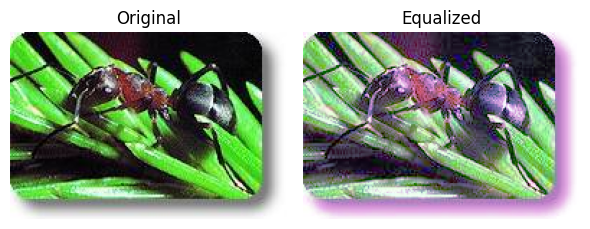

In [ ]:
import matplotlib.pyplot as plt

sample_pil_img = simple_train_dataset[117][0]

fig, ax = plt.subplots(1, 2, figsize=(6, 2.5))

ax[0].imshow(sample_pil_img)

eq_tfm = torchvision.transforms.RandomEqualize(p=1)
equalized_img = eq_tfm(sample_pil_img)

ax[1].imshow(equalized_img)

ax[0].axis('off');ax[1].axis('off')
ax[0].set_title("Original");ax[1].set_title("Equalized")


plt.tight_layout()
plt.show()

### Equalize(ColorJitter(contrast))
- since this transformation improves contrast, lets try to decrease it and then see what Equalize does.
- as seen below, it does ***remove*** the lowered contrast applied to the image.

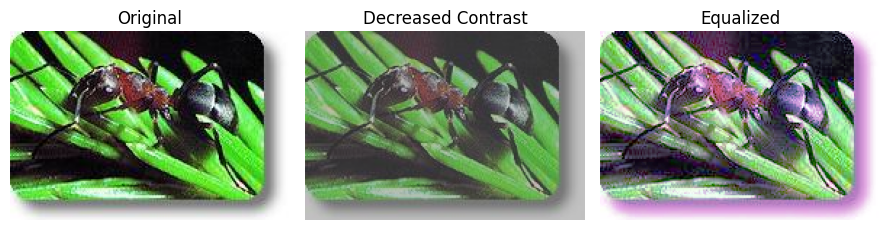

In [ ]:
import matplotlib.pyplot as plt

sample_pil_img = simple_train_dataset[117][0]

fig, ax = plt.subplots(1, 3, figsize=(9, 2.5))

ax[0].imshow(sample_pil_img);ax[0].set_title("Original");ax[0].axis("off")

decrease_contrast_tfm = torchvision.transforms.ColorJitter(contrast=0.5)

eq_tfm = torchvision.transforms.RandomEqualize(p=1)

decreased_contrast_img = decrease_contrast_tfm(sample_pil_img)

equalized_img = eq_tfm(decreased_contrast_img)

ax[1].imshow(decreased_contrast_img)
ax[1].axis('off')
ax[1].set_title("Decreased Contrast")


ax[2].imshow(equalized_img)
ax[2].axis('off')
ax[2].set_title("Equalized")


plt.tight_layout()
plt.show()

### Trying to know the inner workings
1. the `lut` lookup table gets generated by knowing the avg-count an intensity should have(sum(count(intensity) over intensity $\epsilon \,\, [0..254] $))/255
  1. the -h[-1]//255 is done because the value 255, i.e. the 256th pixel intensity value is not considered.
2. <font color="pink">Initial hypothesis failed</font>
  1. `lut` is used to know the new pixel-intensity given the old pixel intensity, because it could serve as a map, per color-channel, to know the new pixel intensity given the old one.
  2. this is not true since new pixel intensities > 255(257) were observed
3. <font color="red">Untested New Hypothesis</font>
  1. `lut` per channel is an increasing list, i.e. a cumulative sum.
  2. the *lookup* probably means `CumulLookUp(pixel-intensity)` lookup.

In [ ]:
print(sample_pil_img.size, sample_pil_img.im.histogram)

(193, 130) <built-in method histogram of ImagingCore object at 0x7a935c8c4e30>


In [ ]:
print(len(sample_pil_img.histogram(None)))

768


In [ ]:
print("Counts per pixel-intensity value, per color-channel(index i has count arr[i]):")
print(sample_pil_img.histogram(None))

Counts per pixel-intensity value, per color-channel(index i has count arr[i]):
[691, 105, 94, 106, 117, 145, 174, 257, 268, 304, 378, 388, 297, 266, 274, 187, 181, 189, 158, 143, 165, 154, 127, 154, 167, 134, 148, 132, 169, 150, 148, 163, 142, 149, 147, 123, 135, 126, 97, 106, 153, 119, 125, 120, 110, 121, 131, 117, 119, 117, 118, 101, 107, 101, 92, 102, 92, 118, 79, 71, 89, 84, 79, 90, 101, 81, 79, 93, 84, 82, 88, 81, 93, 93, 98, 94, 87, 103, 108, 96, 92, 107, 105, 109, 105, 107, 111, 118, 114, 132, 130, 117, 130, 127, 128, 134, 135, 129, 130, 152, 130, 126, 124, 125, 138, 110, 109, 136, 137, 145, 99, 138, 119, 119, 109, 140, 126, 99, 139, 103, 108, 128, 122, 124, 112, 135, 134, 223, 105, 126, 121, 76, 119, 176, 95, 84, 68, 78, 78, 59, 74, 67, 71, 52, 85, 172, 100, 60, 65, 70, 50, 51, 62, 77, 50, 41, 86, 154, 53, 60, 57, 37, 63, 46, 57, 30, 53, 37, 36, 42, 115, 53, 66, 54, 36, 38, 51, 27, 50, 31, 25, 36, 19, 28, 32, 21, 129, 73, 40, 29, 40, 42, 27, 17, 19, 15, 33, 37, 17, 57, 140, 62,

In [ ]:
import functools, operator

import pandas as pd
import seaborn as sns


h = sample_pil_img.histogram(None)
lut = []
for b in range(0, len(h), 256):
  histo = [_f for _f in h[b : b + 256] if _f]
  if len(histo) <= 1:
    lut.extend(list(range(256)))
  else:
    step = (functools.reduce(operator.add, histo) - histo[-1]) // 255
    print(f"step = {step} for b = {b}")
    if not step:
      lut.extend(list(range(256)))
    else:
      n = step // 2
      # cumulative counts being stored
      for i in range(256):
        lut.append(n // step)
        n = n + h[i + b]

# x = np.arange(len(histo))  # x-axis values

# # Create a DataFrame
# data = {
#     'x': x,
#     'Actual Histo': histo,
#     'Equalized Histo': lut
# }


# df = pd.DataFrame(data)

# # Plotting
# sns.barplot(data=df.melt(id_vars='x'), x='x', y='value', hue='variable')

# # Add labels and title
# plt.xlabel('Index')
# plt.ylabel('Height')
# plt.title('Bar Plot with Two Arrays of Same Heights')

# # Show plot
# plt.show()



step = 96 for b = 0
step = 93 for b = 256
step = 96 for b = 512


In [ ]:
print(sample_pil_img.im.bands)

3


In [ ]:
print(min(lut[:256]), max(lut[:256]), min(lut[256:512]), max(lut[256:512]), min(lut[512:]), max(lut[512:]))

0 257 0 258 0 257


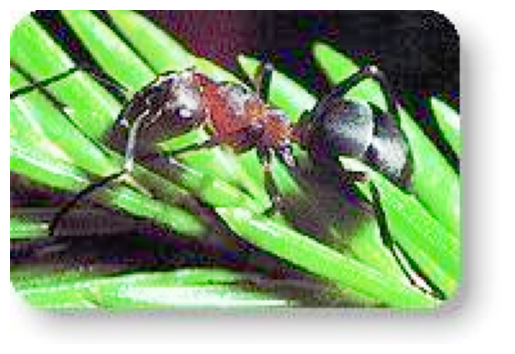

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

sample_pil_img_tnsr = torchvision.transforms.functional.pil_to_tensor(sample_pil_img)
sample_pil_img_tnsr.numpy().shape # 3 x H x W

from copy import deepcopy
arr = deepcopy(sample_pil_img_tnsr.numpy())

result = np.take(lut, arr.ravel()).reshape(arr.shape)

# Display the image
plt.imshow(np.transpose(result, (1, 2, 0)))  # Transpose to (H, W, 3) for Matplotlib
plt.axis('off')  # Turn off axis
plt.show()


In [ ]:
import numpy as np

# Example list of 4 values and their CDFs
values = [1, 2, 3, 4]
cdfs = [0.1, 0.4, 0.7, 1.0]  # Cumulative probabilities from a uniform distribution

# Function to sample from the distribution
def sample_uniform_distribution(cdfs, values):

  u = np.random.uniform(0, 1)  # Generate a random number from a uniform distribution
  for i, cdf in enumerate(cdfs):
    if u <= cdf:
      return values[i]
# Generate a sample from the distribution
sample = sample_uniform_distribution(cdfs, values)
print("Sampled value:", sample)

Sampled value: 2


## LinearTransformation
- doesn't support PIL image, hence image has to be converted to a tensor
- you'll have to downsize the image before doing this, or this is computationally less worse for low-resolution images
- the below is just a demonstration, not to be replicated since the matrix generation is <font color="pink">extremely computationally intensive</font>.
- `contigous()` is **required** while generating the image tensor from the PIL image
  - otherwise the tensor could be spread across non-contiguous chunks leading to a runtime error when the [`view(-1, D)`](https://github.com/pytorch/vision/blob/main/torchvision/transforms/transforms.py#L1152) is called in the `forward(...)` method of the transform.
- [Whitening usage Reference](https://github.com/pytorch/vision/blob/main/test/test_transforms.py#L1430)
  - the reference tells us that the transformation matrix + the mean vector is computed from a sample of 1000 randomly generated images
    - this is because PCA requires a collection of samples
    - the *dimensions/features* in this case is **each pixel of each channel**
    - on flattening the pixel-array of each image, we get a feature-matrix which will be used for PCA computation
  - <font color="red">Why does such a matrix generation have a whitening effect?</font>
  - <font color="lightgreen">Applications of whitening</font>
    - Whitening can help in decorrelating features(because PCA computation), reducing redundancy.
      - correlated features ---> higher redundancy ---> slower convergence, exploding/vanishing gradient

In [ ]:
import numpy as np
import torch, torchvision

def fetch_whitening_transform(n):
  num_samples = 1000
  x = torch.randn(num_samples, 3, n, n)
  flat_x = x.view(x.size(0), x.size(1) * x.size(2) * x.size(3))

  # compute principal components
  sigma = torch.mm(flat_x.t(), flat_x) / flat_x.size(0)
  u, s, _ = np.linalg.svd(sigma.numpy())
  zca_epsilon = 1e-10  # avoid division by 0
  d = torch.Tensor(np.diag(1.0 / np.sqrt(s + zca_epsilon)))
  u = torch.Tensor(u)
  principal_components = torch.mm(torch.mm(u, d), u.t())
  mean_vector = torch.sum(flat_x, dim=0) / flat_x.size(0)

  return torchvision.transforms.LinearTransformation(principal_components, mean_vector)

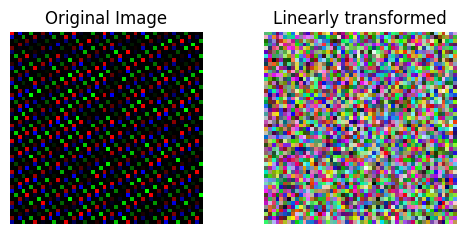

In [ ]:
import matplotlib.pyplot as plt
import torch, torchvision

fig, ax = plt.subplots(1, 2, figsize=(6, 2.5))

n = 50
sample_tensor = torch.randint(10, 256, (3, n, n))

whitening_tfm = fetch_whitening_transform(n)

linear_tfm_tensor = whitening_tfm(sample_tensor)

tensor_to_pil_img_tfm = torchvision.transforms.ToPILImage(mode="RGB")

sample_tensor_img = tensor_to_pil_img_tfm(sample_tensor)
linear_tfm_tensor_img = tensor_to_pil_img_tfm(linear_tfm_tensor)

ax[0].imshow(sample_tensor_img);ax[0].axis("off")
ax[0].set_title('Original Image')

ax[1].imshow(linear_tfm_tensor_img)
ax[1].axis("off");ax[1].set_title("Linearly transformed")

plt.show()

## ClampBoundingBoxes
- As per documentation
  > Clamp bounding boxes to their corresponding image dimensions.
  The clamping is done according to the bounding boxes canvas_size meta-data.
- This is a pre-processing step
  - if the bboxes mentioned as labels in a `(image,label)` dataset suffer from out-of-bounds issue, this can be used to rectify it.
  - when bboxes are *predicted* as part of object detection, the predicted bboxes could very well be out-of-image-bounds.
  - when bboxes are part of the label, and augmentation methods such as cropping or resizing are to be used
    - for resizing, it makes perfect sense to *resize* the bbox via clamping
    - for cropping, the bbox should also be cropped to tell the model that only that small portion of the bbox is where the (cropped)object exists.
      - if the object doesn't exist in the cropped image, i.e. the bbox is completely out-of-image-bounds(not in the overlapping sense), then ideally the label should be changed to `
      "no object"`.

BoundingBoxes([[ 10,  10,  20,  30],
               [ 40,  50,  25,  20],
               [ -5,  -5,  30,  50],
               [ 10,  10, 194,  10]], format=BoundingBoxFormat.XYWH, canvas_size=(129, 192))

Clamped Bounding boxes w.r.t. canvas (130, 193) = 
BoundingBoxes([[ 10,  10,  20,  30],
               [ 40,  50,  25,  20],
               [  0,   0,  25,  45],
               [ 10,  10, 182,  10]], format=BoundingBoxFormat.XYWH, canvas_size=(129, 192))



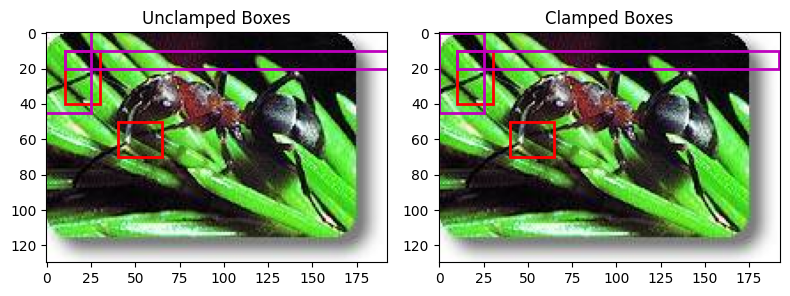

In [ ]:
import torchvision, torch
import os
import matplotlib.patches as patches
import matplotlib.pyplot as plt

dir_path = './drive/My Drive/learning pytorch/ants_vs_bees_classification/hymenoptera'

train_dir_path = os.path.join(dir_path, "train")

simple_train_dataset = torchvision.datasets.folder.ImageFolder(
    train_dir_path
)

sample_pil_img = simple_train_dataset[117][0]

img_width, img_height = sample_pil_img.size

# Note: format is xmin, ymin, width, height, i.e. XYWH
bounding_boxes_within = [
    [10, 10, 20, 30],
    [40, 50, 25, 20],
    [-5, -5, 30, 50],
    [10, 10, img_width+1, 10]
]
bbox_tensors = torch.tensor(bounding_boxes_within)
bboxes_within = torchvision.tv_tensors.BoundingBoxes(
  bbox_tensors,
  format=torchvision.tv_tensors.BoundingBoxFormat.XYWH,
  canvas_size=(img_height-1, img_width-1) # -1, -1 since coordinate system is 0-indexed
)
print(bboxes_within)

clamp_bbox_tfm = torchvision.transforms.v2.ClampBoundingBoxes()
clamped_bboxes = clamp_bbox_tfm(bboxes_within)

print(f"\nClamped Bounding boxes w.r.t. canvas {img_height, img_width} = \n{clamped_bboxes}\n")

fig, ax = plt.subplots(1, 2, figsize=(8, 3))

ax[0].imshow(sample_pil_img);ax[0].set_title("Unclamped Boxes") # ;ax[0].axis('off')
ax[1].imshow(sample_pil_img);ax[1].set_title("Clamped Boxes") # ;ax[1].axis('off')

# label clamped boxes as magenta, unclamped ones as red
color_arr = ['r' if x.item() is True else 'm' for x in torch.all((clamped_bboxes == bboxes_within), dim=1) ]

for i, bbox in enumerate(bboxes_within):
  rect = patches.Rectangle(
      (bbox[0].item(), bbox[1].item()),
      bbox[2].item(), bbox[3].item(),
      linewidth=2, edgecolor=color_arr[i], facecolor='none')
  ax[0].add_patch(rect)

for i, bbox in enumerate(clamped_bboxes):
  rect = patches.Rectangle(
      (bbox[0].item(), bbox[1].item()),
      bbox[2].item(), bbox[3].item(),
      linewidth=2, edgecolor=color_arr[i], facecolor='none')
  ax[1].add_patch(rect)

plt.tight_layout()
plt.show()

### Resize and Clamp

BoundingBoxes([[ 10,  10,  20,  30],
               [ 40,  50,  25,  20],
               [ -5,  -5,  30,  50],
               [ 10,  10, 194,  10]], format=BoundingBoxFormat.XYWH, canvas_size=(99, 147)) 


Clamped boxes:
BoundingBoxes([[ 10,  10,  20,  30],
               [ 40,  50,  25,  20],
               [  0,   0,  25,  45],
               [ 10,  10, 137,  10]], format=BoundingBoxFormat.XYWH, canvas_size=(99, 147))


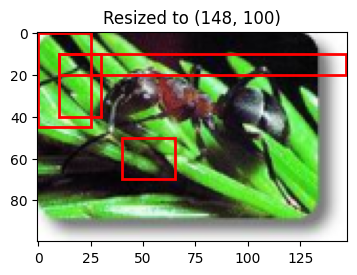

In [ ]:
import matplotlib.patches as patches

fig, ax = plt.subplots(1, figsize=(4, 3))

resize_tfm = torchvision.transforms.Resize(
    size=100
)

rsz_img = resize_tfm(sample_pil_img)

rsz_w, rsz_h = rsz_img.size

bboxes_within = torchvision.tv_tensors.BoundingBoxes(
  bbox_tensors,
  format=torchvision.tv_tensors.BoundingBoxFormat.XYWH,
  canvas_size=(rsz_h-1, rsz_w-1) # -1, -1 since coordinate system is 0-indexed
)
print(bboxes_within, "\n")

clamp_bbox_tfm = torchvision.transforms.v2.ClampBoundingBoxes()
clamped_bboxes = clamp_bbox_tfm(bboxes_within)

print(f"\nClamped boxes:\n{clamped_bboxes}")

ax.imshow(rsz_img)

for bbox in clamped_bboxes:
  rect = patches.Rectangle(
      (bbox[0].item(), bbox[1].item()),
      bbox[2].item(), bbox[3].item(),
      linewidth=2, edgecolor='r', facecolor='none')
  ax.add_patch(rect)

plt.title(f"Resized to {rsz_w, rsz_h}")
plt.show()

### Crop-n-clamp
1. need to know the crop-window center or else the coordinates of bboxes in the new cropped image won't be known aptly, rendering clamping useless.
2. Random cropping can be simulated by randomly generating the centers and `(height,width)` values for the crop-windows, followed by using [`torchvision.tranforms.functional.crop(...)`](https://github.com/pytorch/vision/blob/main/torchvision/transforms/functional.py#L522)

BoundingBoxes([[ 10,  10,  20,  30],
               [ 40,  50,  25,  20],
               [ -5,  -5,  30,  50],
               [ 10,  10, 194,  10]], format=BoundingBoxFormat.XYWH, canvas_size=(29, 29)) 


Crop-center adjusted bounding boxes:
BoundingBoxes([[-35, -15,  20,  30],
               [ -5,  25,  25,  20],
               [-50, -30,  30,  50],
               [-35, -15, 194,  10]], format=BoundingBoxFormat.XYWH, canvas_size=(29, 29))


Clamped boxes:
BoundingBoxes([[ 0,  0,  0, 15],
               [ 0, 25, 20,  4],
               [ 0,  0,  0, 20],
               [ 0,  0, 29,  0]], format=BoundingBoxFormat.XYWH, canvas_size=(29, 29))


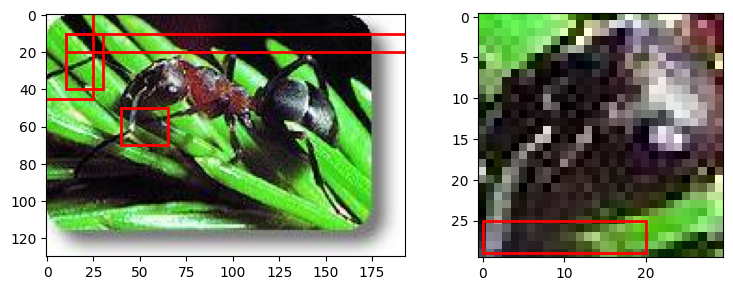

In [ ]:
from copy import deepcopy

fig, ax = plt.subplots(1, 2, figsize=(8, 3))

top, left, width, height = 25, 45, 30, 30
cropped_pil_img = torchvision.transforms.functional.crop(
    img=sample_pil_img, top=top, left=left, width=width, height=height)

ax[0].imshow(sample_pil_img)
ax[1].imshow(cropped_pil_img)

bounding_boxes_within = [
    [10, 10, 20, 30],
    [40, 50, 25, 20],
    [-5, -5, 30, 50],
    [10, 10, img_width+1, 10]
]
bbox_tensors = torch.tensor(bounding_boxes_within)

bboxes_within = torchvision.tv_tensors.BoundingBoxes(
  bbox_tensors,
  format=torchvision.tv_tensors.BoundingBoxFormat.XYWH,
  canvas_size=(cropped_pil_img.height-1, cropped_pil_img.width-1) # -1, -1 since coordinate system is 0-indexed
)
print(bboxes_within, "\n")

for bbox in bboxes_within:
  rect = patches.Rectangle(
      (bbox[0].item(), bbox[1].item()),
      bbox[2].item(), bbox[3].item(),
      linewidth=2, edgecolor='r', facecolor='none')
  ax[0].add_patch(rect)

bboxes_within_cropped_center_adj = deepcopy(bboxes_within)
for bbox in bboxes_within_cropped_center_adj:
  bbox[0] -= left
  bbox[1] -= top

print(f"\nCrop-center adjusted bounding boxes:\n{bboxes_within_cropped_center_adj}\n")

clamp_bbox_tfm = torchvision.transforms.v2.ClampBoundingBoxes()
clamped_bboxes = clamp_bbox_tfm(bboxes_within_cropped_center_adj)

print(f"\nClamped boxes:\n{clamped_bboxes}")


for bbox in clamped_bboxes:
  if bbox[2].item() and bbox[3].item():
    rect = patches.Rectangle(
        (bbox[0].item(), bbox[1].item()),
        bbox[2].item(), bbox[3].item(),
        linewidth=2, edgecolor='r', facecolor='none')
    ax[1].add_patch(rect)

plt.tight_layout()
plt.show()

In [ ]:
import torch, torchvision

class RandomCropCenter(torchvision.transforms.RandomCrop):
  """
    self.center: reference point of crop, stored as (left, top, height, width)
  """
  def __init__(self, size):
    super(RandomCropCenter, self).__init__(size=size)

  def forward(self, img):
    """
    Args:
        img (PIL Image or Tensor): Image to be cropped.

    Returns:
        PIL Image or Tensor: Cropped image.
    """
    if self.padding is not None:
      img = torchvision.transforms.functional.pad(img, self.padding, self.fill, self.padding_mode)

    _, height, width = torchvision.transforms.functional.get_dimensions(img)

    # pad the width if needed
    if self.pad_if_needed and width < self.size[1]:
      padding = [self.size[1] - width, 0]
      img = torchvision.transforms.functional.pad(img, padding, self.fill, self.padding_mode)

    # pad the height if needed
    if self.pad_if_needed and height < self.size[0]:
      padding = [0, self.size[0] - height]
      img = torchvision.transforms.functional.pad(img, padding, self.fill, self.padding_mode)

    i, j, h, w = self.get_params(img, self.size)

    self.crop_center = (i, j, h, w)

    return torchvision.transforms.functional.crop(img, *self.crop_center)

BoundingBoxes([[ 10,  10,  20,  30],
               [ 40,  50,  25,  20],
               [ -5,  -5,  30,  50],
               [ 10,  10, 194,  10]], format=BoundingBoxFormat.XYWH, canvas_size=(29, 29)) 


Crop center = (37, 118, 70, 50)


Crop-center adjusted bounding boxes:
BoundingBoxes([[ -27, -108,   20,   30],
               [   3,  -68,   25,   20],
               [ -42, -123,   30,   50],
               [ -27, -108,  194,   10]], format=BoundingBoxFormat.XYWH, canvas_size=(29, 29))


Clamped boxes:
BoundingBoxes([[ 0,  0,  0,  0],
               [ 3,  0, 25,  0],
               [ 0,  0,  0,  0],
               [ 0,  0, 29,  0]], format=BoundingBoxFormat.XYWH, canvas_size=(29, 29))


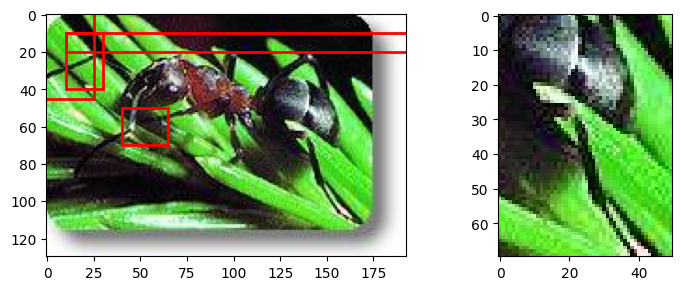

In [ ]:
from copy import deepcopy

fig, ax = plt.subplots(1, 2, figsize=(8, 3))

ax[0].imshow(sample_pil_img)

bounding_boxes_within = [
    [10, 10, 20, 30],
    [40, 50, 25, 20],
    [-5, -5, 30, 50],
    [10, 10, img_width+1, 10]
]
bbox_tensors = torch.tensor(bounding_boxes_within)

##################################. Crop-n-imshow ##################################
rcc = RandomCropCenter(size=(70, 50))
cropped_image = rcc(img = sample_pil_img)
left, top = rcc.crop_center[:2]

print(f"\nCrop center = {rcc.crop_center}\n")

ax[1].imshow(cropped_image)

############################## Define bounding boxes. #########################

bboxes_within = torchvision.tv_tensors.BoundingBoxes(
  bbox_tensors,
  format=torchvision.tv_tensors.BoundingBoxFormat.XYWH,
  canvas_size=(cropped_image.height-1, cropped_image.width-1) # -1, -1 since coordinate system is 0-indexed
)
print(f"\nOriginal bboxes = {bboxes_within}\n")

# add bbox to original image
for bbox in bboxes_within:
  rect = patches.Rectangle(
      (bbox[0].item(), bbox[1].item()),
      bbox[2].item(), bbox[3].item(),
      linewidth=2, edgecolor='r', facecolor='none')
  ax[0].add_patch(rect)

########################## Re-adjust bounding boxes.  #########################

bboxes_within_cropped_center_adj = deepcopy(bboxes_within)
for bbox in bboxes_within_cropped_center_adj:
  bbox[0] -= left
  bbox[1] -= top

print(f"\nCrop-center adjusted bounding boxes:\n{bboxes_within_cropped_center_adj}\n")

############################### ClampBoundingBoxes  ###########################

clamp_bbox_tfm = torchvision.transforms.v2.ClampBoundingBoxes()
clamped_bboxes = clamp_bbox_tfm(bboxes_within_cropped_center_adj)

print(f"\nClamped boxes:\n{clamped_bboxes}")


for bbox in clamped_bboxes:
  if bbox[2].item() and bbox[3].item():
    rect = patches.Rectangle(
        (bbox[0].item(), bbox[1].item()),
        bbox[2].item(), bbox[3].item(),
        linewidth=2, edgecolor='r', facecolor='none')
    ax[1].add_patch(rect)

plt.tight_layout()
plt.show()

## SanitizeBoundingBoxes

- as mentioned in torchvision documentation
> This transform removes bounding boxes and their associated labels/masks that:
  - are below a given `min_size`: by default this also removes degenerate boxes that have e.g. `X2 <= X1`.
  - have any coordinate outside of their corresponding image. You may want to call `ClampBoundingBoxes` first to avoid undesired removals.
- Therefore, this is a **pre-processing step**.
-

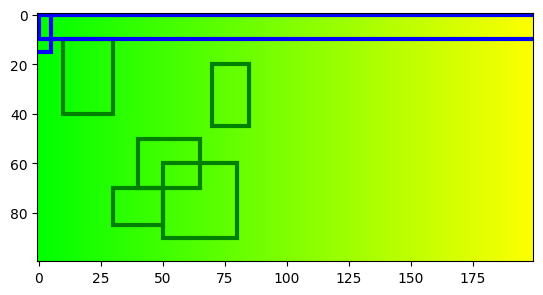

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


# Define image dimensions
height = 100
width = 200
channels = 3  # Assuming RGB channels

# Create an empty image tensor
image_tensor = np.zeros((height, width, channels), dtype=np.uint8)

# Generate red-to-white gradient
for y in range(height):
    for x in range(width):
        # Compute red intensity as a function of x coordinate
        red_intensity = int(255 * (x / width))
        # Set pixel color
        image_tensor[y, x] = [red_intensity, 255, 0]  # RGB values: [red_intensity, 255, 255] for red-to-white


# Create a figure and axis
fig, ax = plt.subplots()

# Display the image
ax.imshow(image_tensor)

# Define bounding boxes (format: [xmin, ymin, width, height])
bounding_boxes = [[10, 10, 20, 30],
                  [40, 50, 25, 20],
                  [70, 20, 15, 25],
                  [30, 70, 20, 15],
                  [50, 60, 30, 30],
                  [-5, -5, 10, 20],
                   [0, 0, width+1, 10]]

# Add bounding boxes to the image
for bbox in bounding_boxes[:-2]:
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=3, edgecolor='g', facecolor='none')
    ax.add_patch(rect)

# Add out-of-image-bounds bounding boxes to the image
for bbox in bounding_boxes[-2:]:
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=3, edgecolor='b', facecolor='none')
    ax.add_patch(rect)

# Show the image with bounding boxes
plt.show()
